# Análisis de quiebra de compañías

Las compañias entran en lo que se denomina estado de cesación de pagos (corresponde al término anglosajón default), cuando los activos con los que cuentan no son suficientes a efectos de afrontas sus pasivos (o sus deudas). Este dataset toma regitros para el Economic Journal de Taiwan referente a los años 1999 a 2009. El concepto de una empresa en bancarota (estado de cesación de pagos) para definir la variable target es el que corresponde a las leyes de Taiwan.

El objetivo del presente es determinar -en base a los datos recopilados- la posibilidad de que una empresa caiga en estado de cesación de pagos, en base a diversas variables microeconomicas que hacen a los distintos atributos del dataset. Este tipo de análisis resulta interesante para directivos de cualquier clase de empresa, como también para posibles inversores o fondos interesados en reestructurar compañías en estados cercanos a la quiebra, para luego revender las acciones de las mismas.

## EDA

In [134]:
# Importamos las librerias
import pandas as pd
import numpy as np
import matplotlib as mpl
import matplotlib.pyplot as plt
import seaborn as sns
%matplotlib inline

from sklearn.metrics import f1_score
from sklearn.metrics import PrecisionRecallDisplay
from sklearn.metrics import classification_report
from sklearn.metrics import confusion_matrix
from sklearn.metrics import plot_confusion_matrix

In [2]:
# Seteamos el estilo para mpl y sns
sns.set(style="ticks", context="talk")
plt.style.use("dark_background")

In [3]:
# Importamos el dataset con read_csv
df = pd.read_csv('data.csv')
df

,Bankrupt?,ROA(C) before interest and depreciation before interest,ROA(A) before interest and % after tax,ROA(B) before interest and depreciation after tax,Operating Gross Margin,Realized Sales Gross Margin,Operating Profit Rate,Pre-tax net Interest Rate,After-tax net Interest Rate,Non-industry income and expenditure/revenue,...,Net Income to Total Assets,Total assets to GNP price,No-credit Interval,Gross Profit to Sales,Net Income to Stockholder's Equity,Liability to Equity,Degree of Financial Leverage (DFL),Interest Coverage Ratio (Interest expense to EBIT),Net Income Flag,Equity to Liability
0,1,0.370594,0.424389,0.405750,0.601457,0.601457,0.998969,0.796887,0.808809,0.302646,...,0.716845,0.009219,0.622879,0.601453,0.827890,0.290202,0.026601,0.564050,1,0.016469
1,1,0.464291,0.538214,0.516730,0.610235,0.610235,0.998946,0.797380,0.809301,0.303556,...,0.795297,0.008323,0.623652,0.610237,0.839969,0.283846,0.264577,0.570175,1,0.020794
2,1,0.426071,0.499019,0.472295,0.601450,0.601364,0.998857,0.796403,0.808388,0.302035,...,0.774670,0.040003,0.623841,0.601449,0.836774,0.290189,0.026555,0.563706,1,0.016474
3,1,0.399844,0.451265,0.457733,0.583541,0.583541,0.998700,0.796967,0.808966,0.303350,...,0.739555,0.003252,0.622929,0.583538,0.834697,0.281721,0.026697,0.564663,1,0.023982
4,1,0.465022,0.538432,0.522298,0.598783,0.598783,0.998973,0.797366,0.809304,0.303475,...,0.795016,0.003878,0.623521,0.598782,0.839973,0.278514,0.024752,0.575617,1,0.035490
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
6814,0,0.493687,0.539468,0.543230,0.604455,0.604462,0.998992,0.797409,0.809331,0.303510,...,0.799927,0.000466,0.623620,0.604455,0.840359,0.279606,0.027064,0.566193,1,0.029890
6815,0,0.475162,0.538269,0.524172,0.598308,0.598308,0.998992,0.797414,0.809327,0.303520,...,0.799748,0.001959,0.623931,0.598306,0.840306,0.278132,0.027009,0.566018,1,0.038284
6816,0,0.472725,0.533744,0.520638,0.610444,0.610213,0.998984,0.797401,0.809317,0.303512,...,0.797778,0.002840,0.624156,0.610441,0.840138,0.275789,0.026791,0.565158,1,0.097649
6817,0,0.506264,0.559911,0.554045,0.607850,0.607850,0.999074,0.797500,0.809399,0.303498,...,0.811808,0.002837,0.623957,0.607846,0.841084,0.277547,0.026822,0.565302,1,0.044009


In [4]:
# Revisamos la cantidad de filas y columnas
df.shape

(6819, 96)

Como se puede observar, el dataset cuenta con 6.819 registros y 95 atributos (descontando la variable target). Debido a la gran cantidad de atributos, en ocasiones simplificaremos el análisis centrandonos sólo en elgunos de éstos, permitiendo así también una mejor visualización de los gráficos.

In [5]:
# Revisamos alguna información básica del dataset, tal como el tipo de datos y los datos nulos
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 6819 entries, 0 to 6818
Data columns (total 96 columns):
 #   Column                                                    Non-Null Count  Dtype  
---  ------                                                    --------------  -----  
 0   Bankrupt?                                                 6819 non-null   int64  
 1    ROA(C) before interest and depreciation before interest  6819 non-null   float64
 2    ROA(A) before interest and % after tax                   6819 non-null   float64
 3    ROA(B) before interest and depreciation after tax        6819 non-null   float64
 4    Operating Gross Margin                                   6819 non-null   float64
 5    Realized Sales Gross Margin                              6819 non-null   float64
 6    Operating Profit Rate                                    6819 non-null   float64
 7    Pre-tax net Interest Rate                                6819 non-null   float64
 8    After-tax net Int

Como podemos apreciar, los atributos se tratan casi en su mayoría de variables númericas, salvo dos de ellas (además de la variable target) que parecen ser categóricas.

In [6]:
# Chequeamos la cantidad de datos nulos que hay por cada columna
df.isnull().sum().sort_values()

Bankrupt?                                 0
 Total income/Total expense               0
 Retained Earnings to Total Assets        0
 Long-term Liability to Current Assets    0
 Current Liabilities/Equity               0
                                         ..
 Regular Net Profit Growth Rate           0
 After-tax Net Profit Growth Rate         0
 Operating Profit Growth Rate             0
 Net Income Flag                          0
 Equity to Liability                      0
Length: 96, dtype: int64

Como se puede apreciar, no existen datos nulos en el dataset, lo que facilitará nuestro análisis.

In [7]:
# Revisamos algunas medidas estadísticas estándar para el dataset
df.describe()

,Bankrupt?,ROA(C) before interest and depreciation before interest,ROA(A) before interest and % after tax,ROA(B) before interest and depreciation after tax,Operating Gross Margin,Realized Sales Gross Margin,Operating Profit Rate,Pre-tax net Interest Rate,After-tax net Interest Rate,Non-industry income and expenditure/revenue,...,Net Income to Total Assets,Total assets to GNP price,No-credit Interval,Gross Profit to Sales,Net Income to Stockholder's Equity,Liability to Equity,Degree of Financial Leverage (DFL),Interest Coverage Ratio (Interest expense to EBIT),Net Income Flag,Equity to Liability
count,6819.000000,6819.000000,6819.000000,6819.000000,6819.000000,6819.000000,6819.000000,6819.000000,6819.000000,6819.000000,...,6819.000000,6.819000e+03,6819.000000,6819.000000,6819.000000,6819.000000,6819.000000,6819.000000,6819.0,6819.000000
mean,0.032263,0.505180,0.558625,0.553589,0.607948,0.607929,0.998755,0.797190,0.809084,0.303623,...,0.807760,1.862942e+07,0.623915,0.607946,0.840402,0.280365,0.027541,0.565358,1.0,0.047578
std,0.176710,0.060686,0.065620,0.061595,0.016934,0.016916,0.013010,0.012869,0.013601,0.011163,...,0.040332,3.764501e+08,0.012290,0.016934,0.014523,0.014463,0.015668,0.013214,0.0,0.050014
min,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000e+00,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.0,0.000000
25%,0.000000,0.476527,0.535543,0.527277,0.600445,0.600434,0.998969,0.797386,0.809312,0.303466,...,0.796750,9.036205e-04,0.623636,0.600443,0.840115,0.276944,0.026791,0.565158,1.0,0.024477
50%,0.000000,0.502706,0.559802,0.552278,0.605997,0.605976,0.999022,0.797464,0.809375,0.303525,...,0.810619,2.085213e-03,0.623879,0.605998,0.841179,0.278778,0.026808,0.565252,1.0,0.033798
75%,0.000000,0.535563,0.589157,0.584105,0.613914,0.613842,0.999095,0.797579,0.809469,0.303585,...,0.826455,5.269777e-03,0.624168,0.613913,0.842357,0.281449,0.026913,0.565725,1.0,0.052838
max,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,...,1.000000,9.820000e+09,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.0,1.000000


In [8]:
# Realizamos un pivot de lo anterior para facilitar su visualización.
df.describe().T

,count,mean,std,min,25%,50%,75%,max
Bankrupt?,6819.0,0.032263,0.176710,0.0,0.000000,0.000000,0.000000,1.0
ROA(C) before interest and depreciation before interest,6819.0,0.505180,0.060686,0.0,0.476527,0.502706,0.535563,1.0
ROA(A) before interest and % after tax,6819.0,0.558625,0.065620,0.0,0.535543,0.559802,0.589157,1.0
ROA(B) before interest and depreciation after tax,6819.0,0.553589,0.061595,0.0,0.527277,0.552278,0.584105,1.0
Operating Gross Margin,6819.0,0.607948,0.016934,0.0,0.600445,0.605997,0.613914,1.0
...,...,...,...,...,...,...,...,...
Liability to Equity,6819.0,0.280365,0.014463,0.0,0.276944,0.278778,0.281449,1.0
Degree of Financial Leverage (DFL),6819.0,0.027541,0.015668,0.0,0.026791,0.026808,0.026913,1.0
Interest Coverage Ratio (Interest expense to EBIT),6819.0,0.565358,0.013214,0.0,0.565158,0.565252,0.565725,1.0
Net Income Flag,6819.0,1.000000,0.000000,1.0,1.000000,1.000000,1.000000,1.0


In [9]:
# Reemplazamos el nombre de la columna de la variable target
df.rename(columns={'Bankrupt?':'target'}, inplace=True)

In [10]:
# Hacemos un conteo de la variable target
df['target'].value_counts()

0    6599
1     220
Name: target, dtype: int64

/home/jvegasainz/anaconda3/lib/python3.8/site-packages/seaborn/_decorators.py:36: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


<AxesSubplot:xlabel='target', ylabel='count'>

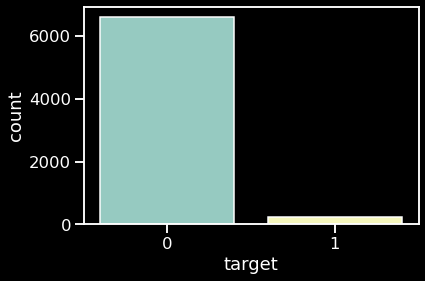

In [11]:
# Hacemos un gráfico para mostrar el conteo de la variable target
sns.countplot('target',data=df)

In [12]:
# Tomamos algunas medidas estadísticas estándar de la variable target
df['target'].describe()

count    6819.000000
mean        0.032263
std         0.176710
min         0.000000
25%         0.000000
50%         0.000000
75%         0.000000
max         1.000000
Name: target, dtype: float64

Como se puede observar existe un gran desbalance respecto de los registros para la variable target. Solo 220 registros corresponden a empresas en quiebra frente a 6.599 correspondientes a empresas que no se encuentran en quiebra.

Deberemos tomar esta cuestión en consideración a la hora de entrenar nuestros modelos y aplicar alguna técnica para balancear el dataset.

In [13]:
# Dividimos las variables númericas de las categóricas
numeric_features = df.dtypes[df.dtypes != 'int64'].index
categorical_features = df.dtypes[df.dtypes == 'int64'].index

# Chequeamos cuáles son las variables categóricas
df[categorical_features].columns.tolist()

['target', ' Liability-Assets Flag', ' Net Income Flag']

Vemos que, además de la variable target, existen dos variables categóricas:
* Liability-Assets Flag hace referencia a los casos en que el pasivo de la empresa es mayor a los activos de la empresa.
* Net Income Flag hace referencia a los casos en que el ingreso neto de la compañía es negativo para los últimos años.

In [14]:
# Hacemos un conteo de la bandera correspondiente a que los pasivos son mayores que los activos
df[' Liability-Assets Flag'].value_counts()

0    6811
1       8
Name:  Liability-Assets Flag, dtype: int64

/home/jvegasainz/anaconda3/lib/python3.8/site-packages/seaborn/_decorators.py:36: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


<AxesSubplot:xlabel=' Liability-Assets Flag', ylabel='count'>

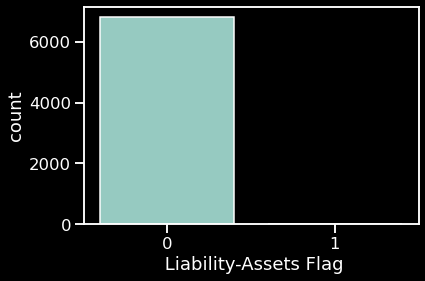

In [15]:
# Hacemos un gráfico para mostrar el conteo de la bandera correspondiente a que los pasivos son mayores que los activos
sns.countplot(' Liability-Assets Flag', data=df)

Como se puede observar, la mayor parte de las veces, los activos son mayores que los pasivos de la empresa en el dataset

In [16]:
# Hacemos un conteo de la bandera correspondiente a que el ingreso neto de la compañía es negativo
df[' Net Income Flag'].value_counts()

1    6819
Name:  Net Income Flag, dtype: int64

/home/jvegasainz/anaconda3/lib/python3.8/site-packages/seaborn/_decorators.py:36: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


<AxesSubplot:xlabel=' Net Income Flag', ylabel='count'>

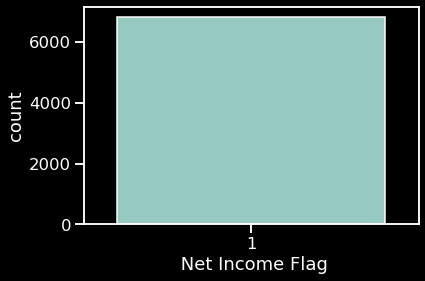

In [17]:
# Hacemos un gráfico para mostrar el conteo de la bandera correspondiente a que el ingreso neto de la compañía es negativo
sns.countplot(' Net Income Flag', data=df)

Como se puede observar, todo los registros corresponden a empresas con ingresos netos negativos para los últimos años.

 Liability-Assets Flag  target
0                       0         6597
                        1          214
1                       1            6
                        0            2
dtype: int64


<AxesSubplot:xlabel=' Liability-Assets Flag', ylabel='count'>

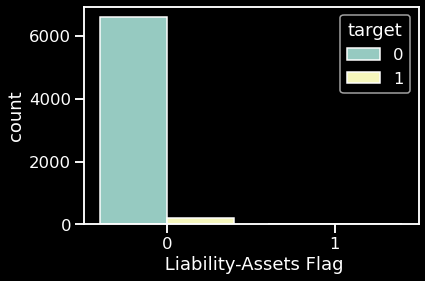

In [18]:
# Hacemos un conteo de la bandera correspondiente a que los pasivos de la empresa son mayores a los activos, contra la variable target
print(df[[' Liability-Assets Flag','target']].value_counts())
sns.countplot(x = ' Liability-Assets Flag',hue = 'target',data=df)

Como se peude observar, cuando los pasivos son mayores que los activos, es más probable que la empresa caiga en estado de cesación de pagos.

 Net Income Flag  target
1                 0         6599
                  1          220
dtype: int64


<AxesSubplot:xlabel=' Net Income Flag', ylabel='count'>

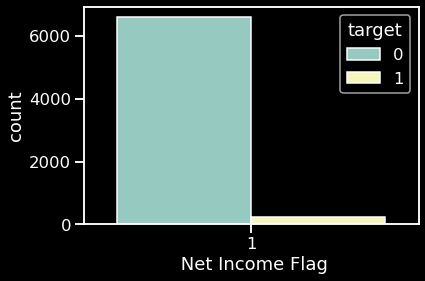

In [19]:
# Hacemos un contedo de la variable correspondiente a ingresos netos negativos, contra la variable target
print(df[[' Net Income Flag','target']].value_counts())
sns.countplot(x = ' Net Income Flag',hue = 'target',data=df)

En este caso el análisis no es muy revelador, ya que la totalidad de los registros corresponden con empresas con ingresos netos negativos para los últimos años.

In [20]:
# Debido a la gran cantidad de variables númericas que existen en el dataset, realizamos un resumen del mismo, tomando aquellas que tienen una mayor correlación positiva y negativa con la variable target
positive_corr = df[numeric_features].corrwith(df['target']).sort_values(ascending=False)[:6].index.tolist()
negative_corr = df[numeric_features].corrwith(df['target']).sort_values()[:6].index.tolist()
target_var = df['target']

df_summary_positive = df[positive_corr +['target']].copy()
df_summary_negative = df[negative_corr +['target']].copy()
df_summary = df[positive_corr + negative_corr +['target']].copy()

df_summary.head()

,Debt ratio %,Current Liability to Assets,Borrowing dependency,Current Liability to Current Assets,Liability to Equity,Current Liabilities/Equity,Net Income to Total Assets,ROA(A) before interest and % after tax,ROA(B) before interest and depreciation after tax,ROA(C) before interest and depreciation before interest,Net worth/Assets,Persistent EPS in the Last Four Seasons,target
0,0.207576,0.147308,0.390284,0.118250,0.290202,0.339077,0.716845,0.424389,0.405750,0.370594,0.792424,0.169141,1
1,0.171176,0.056963,0.376760,0.047775,0.283846,0.329740,0.795297,0.538214,0.516730,0.464291,0.828824,0.208944,1
2,0.207516,0.098162,0.379093,0.025346,0.290189,0.334777,0.774670,0.499019,0.472295,0.426071,0.792484,0.180581,1
3,0.151465,0.098715,0.379743,0.067250,0.281721,0.331509,0.739555,0.451265,0.457733,0.399844,0.848535,0.193722,1
4,0.106509,0.110195,0.375025,0.047725,0.278514,0.330726,0.795016,0.538432,0.522298,0.465022,0.893491,0.212537,1


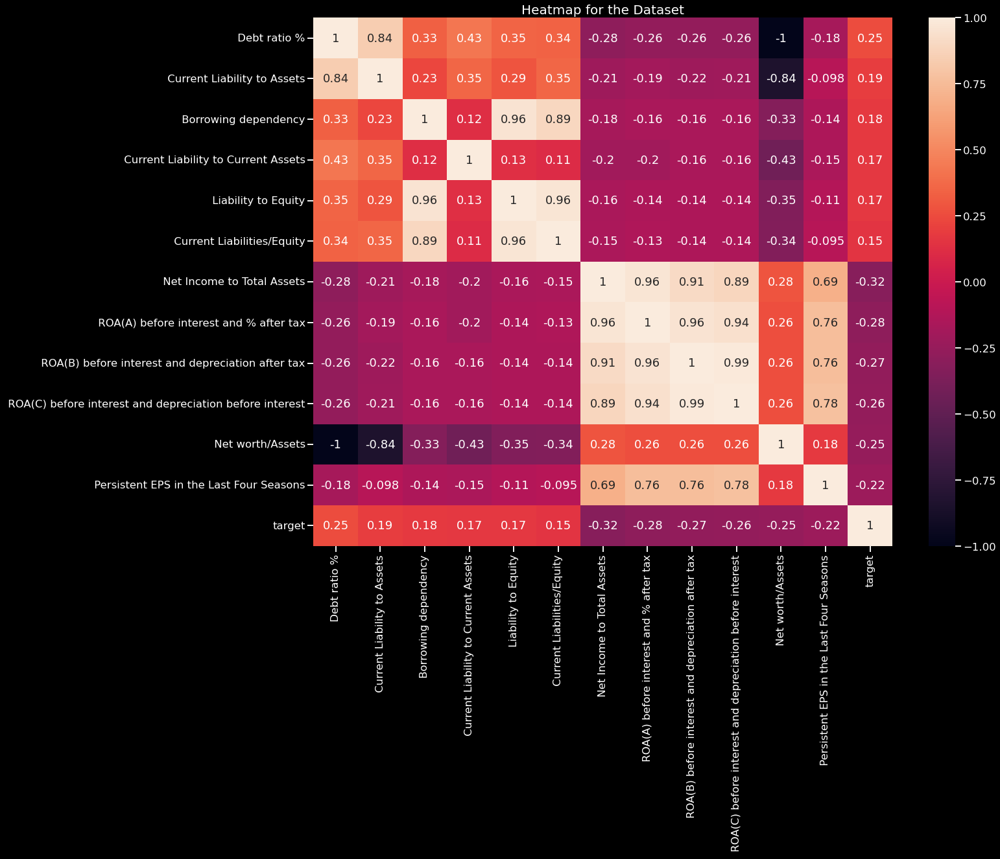

In [21]:
# Hacemos un heatmap para las variables con mayor correlación positiva y negativa con la variable target
plt.rcParams['figure.figsize'] = (20, 15)

sns.heatmap(df_summary.corr(), annot = True)
plt.title('Heatmap for the Dataset', fontsize = 20)
plt.show()

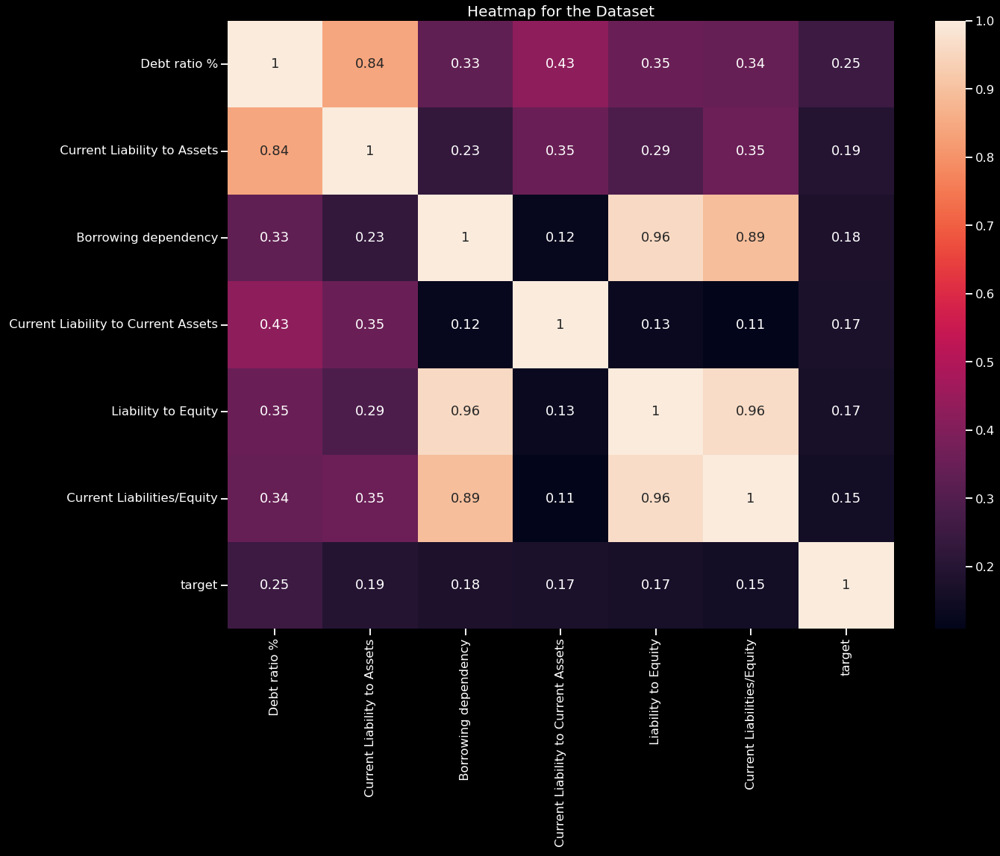

In [22]:
# Hacemos un heatmap para las variables con mayor correlación positiva con la variable target
plt.rcParams['figure.figsize'] = (20, 15)

sns.heatmap(df_summary_positive.corr(), annot = True)
plt.title('Heatmap for the Dataset', fontsize = 20)
plt.show()

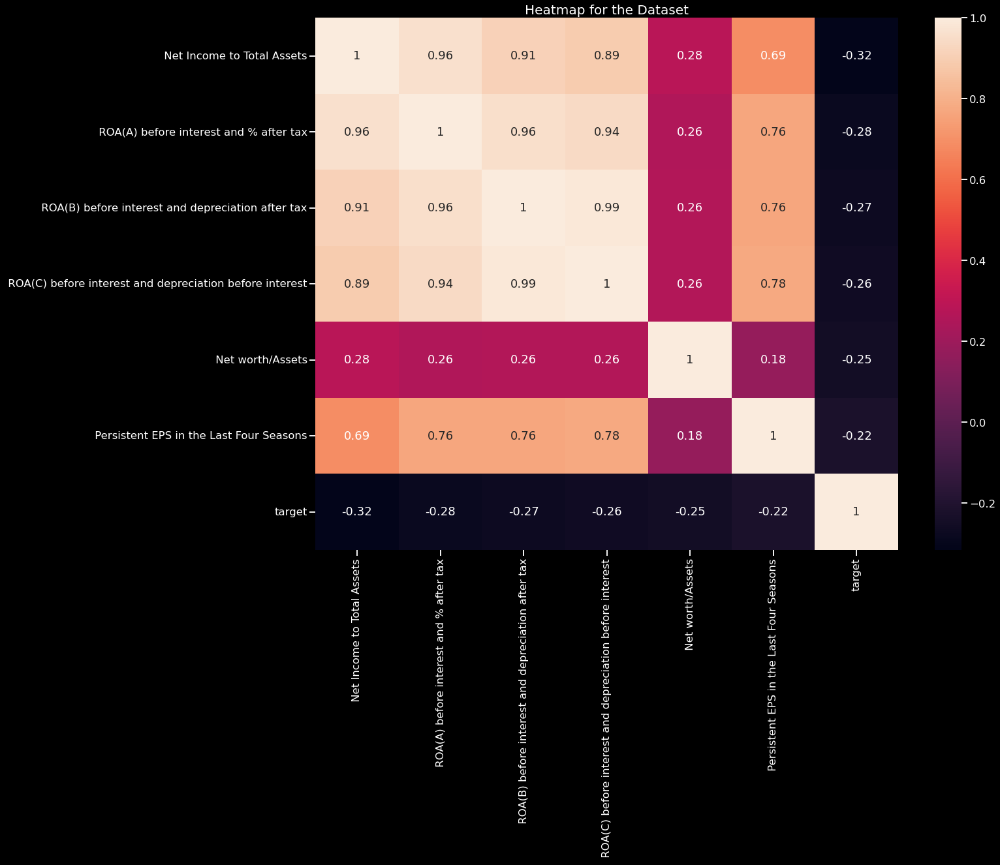

In [23]:
# Hacemos un heatmap para las variables con mayor correlación negativa con la variable target
plt.rcParams['figure.figsize'] = (20, 15)

sns.heatmap(df_summary_negative.corr(), annot = True)
plt.title('Heatmap for the Dataset', fontsize = 20)
plt.show()

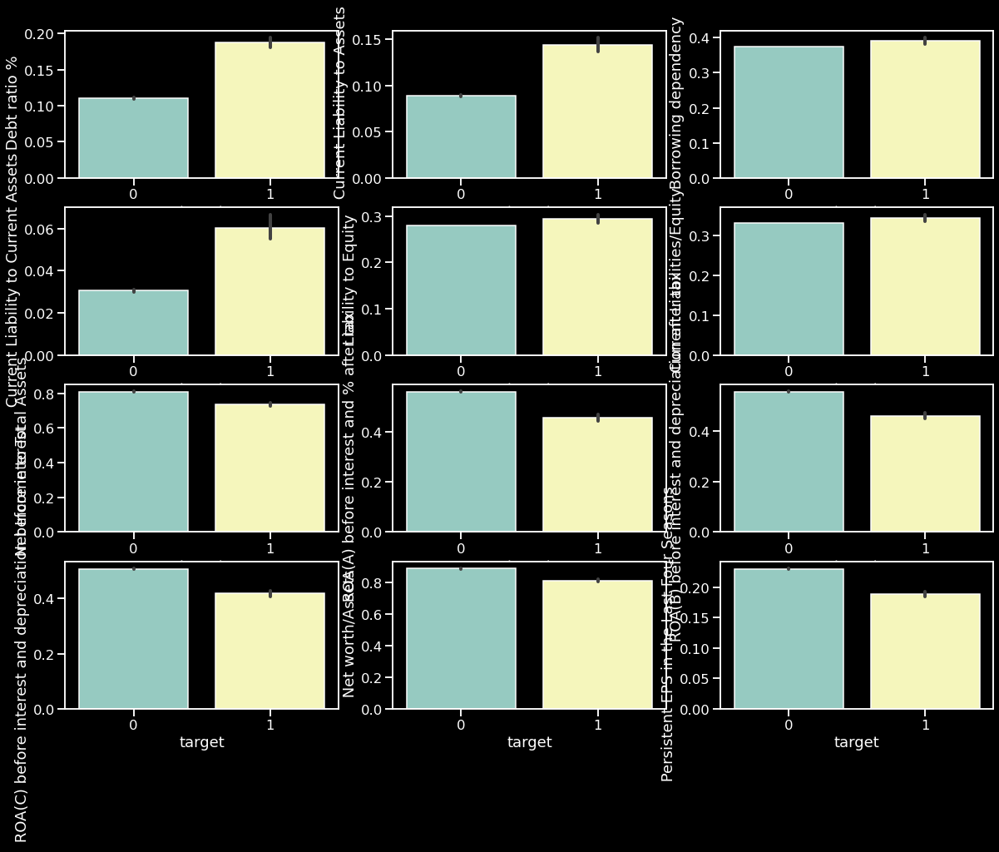

In [24]:
# Realizamos gráficos de barras para mostrar la correlación de las variables con mayor correlación con la variable target
y_values = df_summary.columns.tolist()[:-1]

def corrbargraph(x_value, y_value):

    for i in range(1,13):
        plt.subplot(4,3,i)
        sns.barplot(x=x_value, y=y_value[i-1],data = df)

corrbargraph(df_summary['target'], y_values)

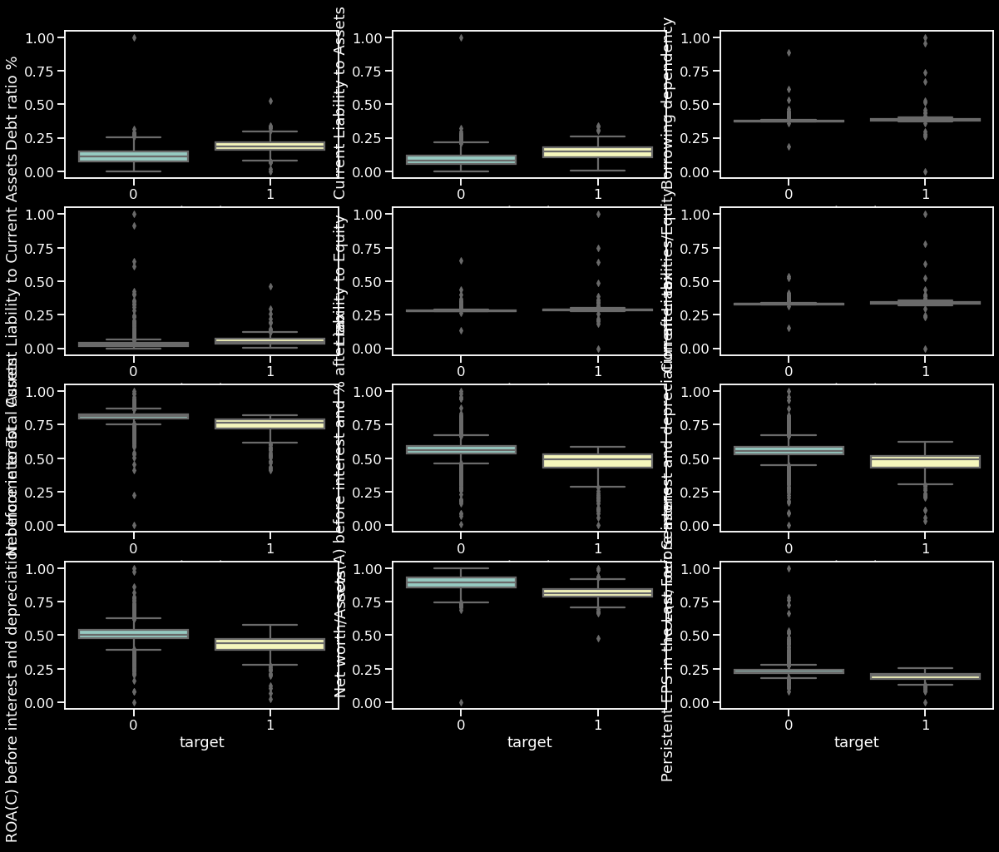

In [25]:
# Realizamos boxplots para mostrar la correlación de las variables con mayor correlación con la variable target
def corrboxplot(x_value, y_value):

    for i in range(1,13):
        plt.subplot(4,3,i)
        sns.boxplot(x=x_value, y=y_value[i-1],data = df)

corrboxplot(df_summary['target'], y_values)

<Figure size 2400x1800 with 0 Axes>

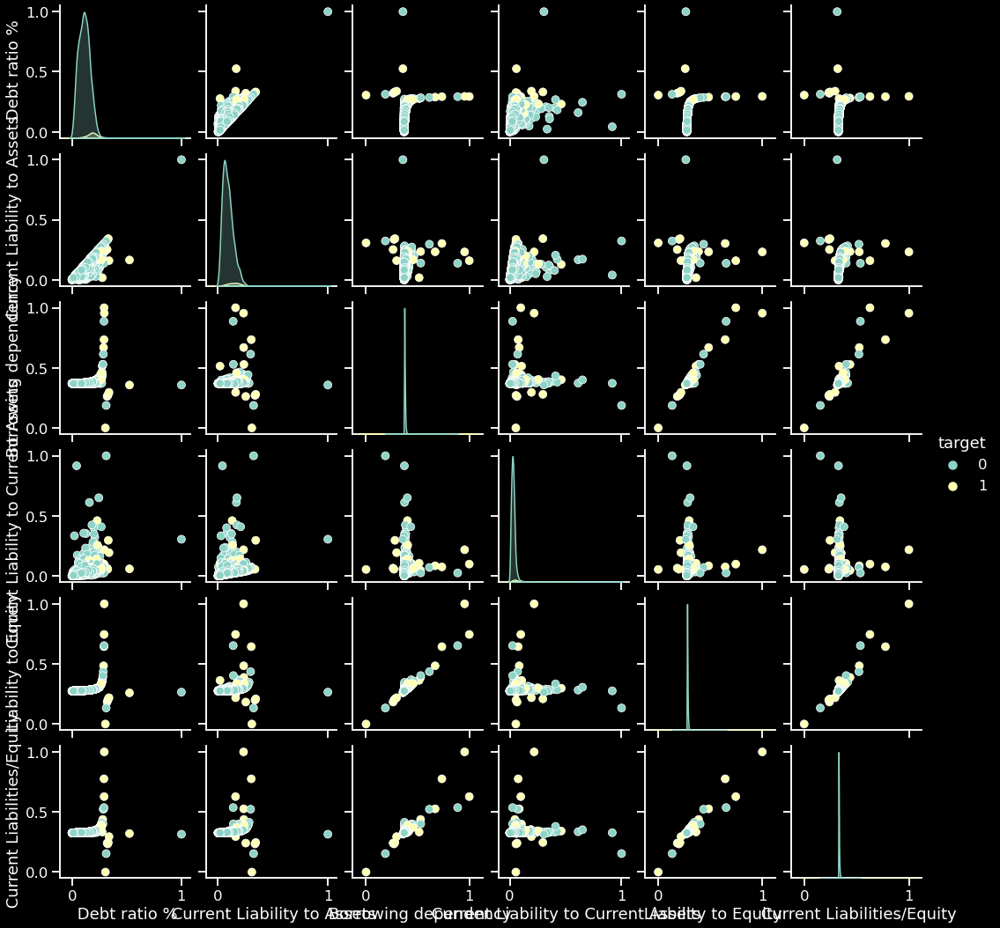

In [26]:
# Realizamos un pairplot para las variables con mayor correlación positiva
plt.figure(dpi = 120)
sns.pairplot(df_summary_positive,hue='target')
plt.show()

<Figure size 2400x1800 with 0 Axes>

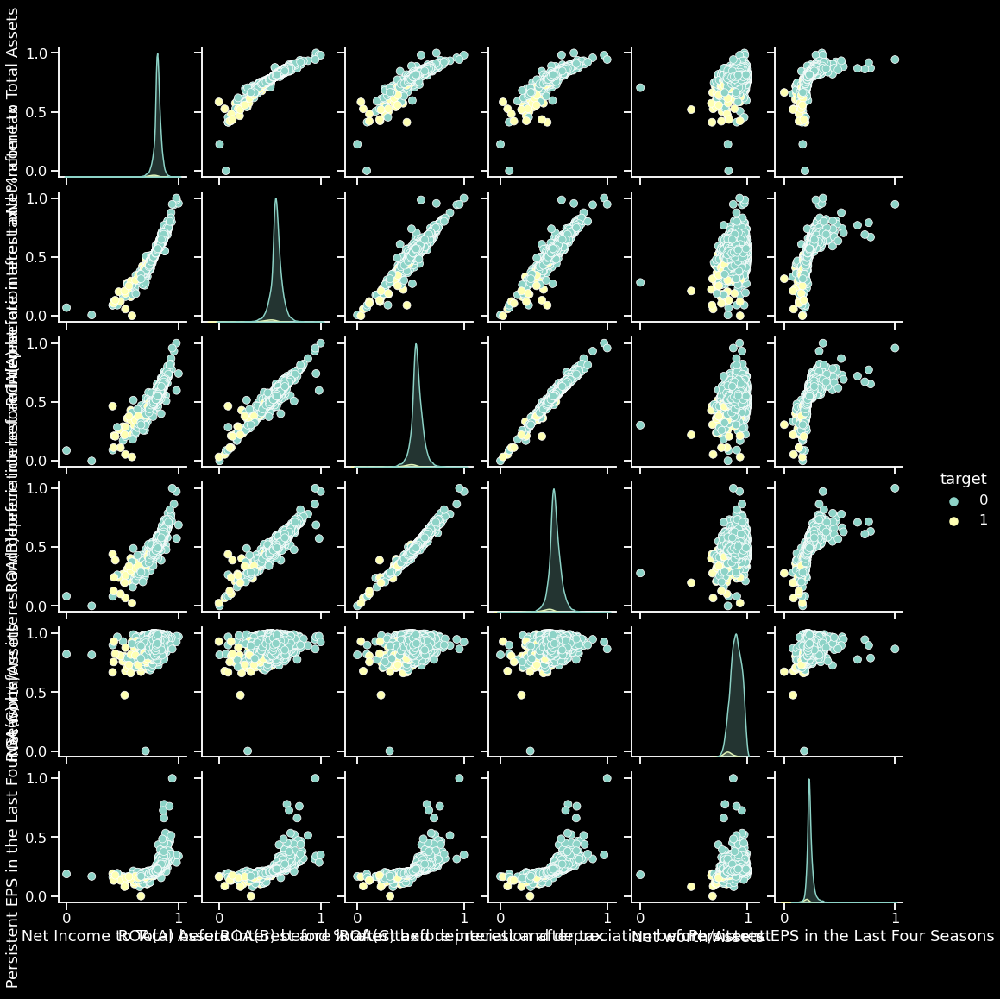

In [27]:
# Realizamos un pairplot para las variables con mayor correlación negativa
plt.figure(dpi = 120)
sns.pairplot(df_summary_negative,hue='target')
plt.show()

Joint plot de Target con otras variables ==>
Correlacion entre Target y  Debt ratio % 0.2501609620666178


<Figure size 500x400 with 0 Axes>

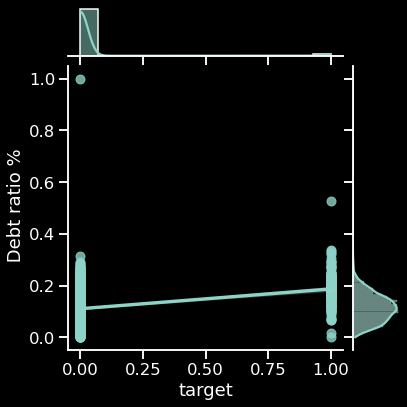

Correlacion entre Target y  Current Liability to Assets 0.19449443585543952


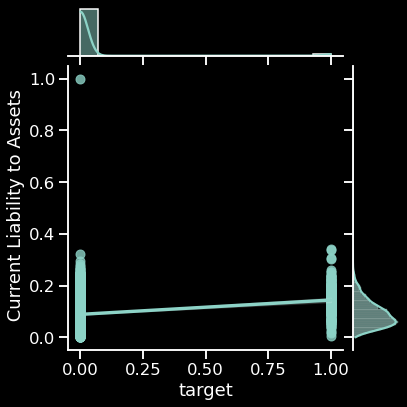

Correlacion entre Target y  Borrowing dependency 0.17654293616159944


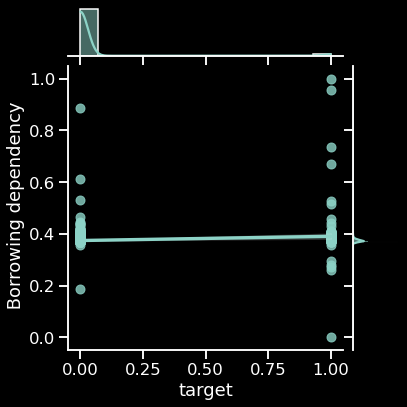

Correlacion entre Target y  Current Liability to Current Assets 0.17130604352180526


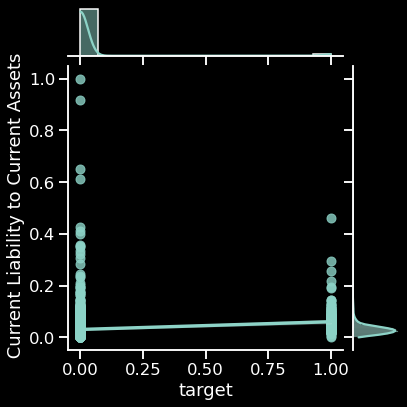

Correlacion entre Target y  Liability to Equity 0.166812097781114


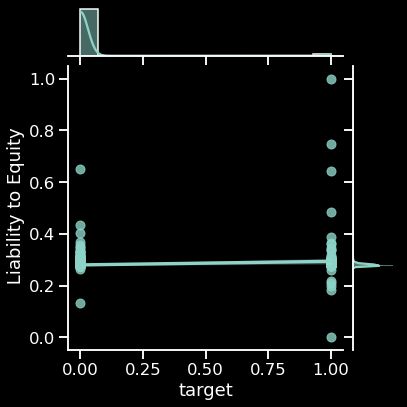

Correlacion entre Target y  Current Liabilities/Equity 0.15382836190696916


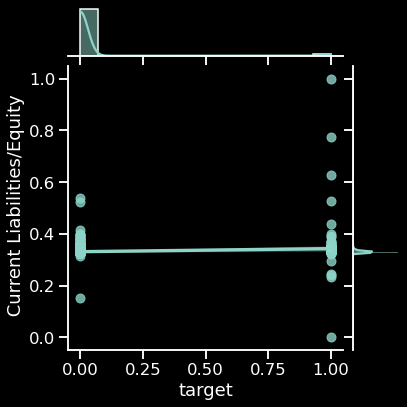

Correlacion entre Target y  Net Income to Total Assets -0.31545697161429925


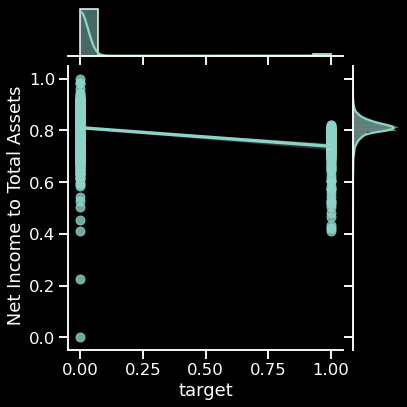

Correlacion entre Target y  ROA(A) before interest and % after tax -0.28294058493448865


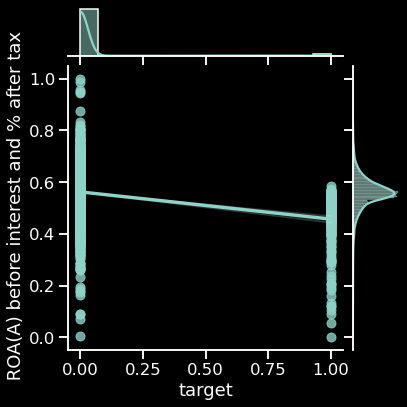

Correlacion entre Target y  ROA(B) before interest and depreciation after tax -0.27305131786329306


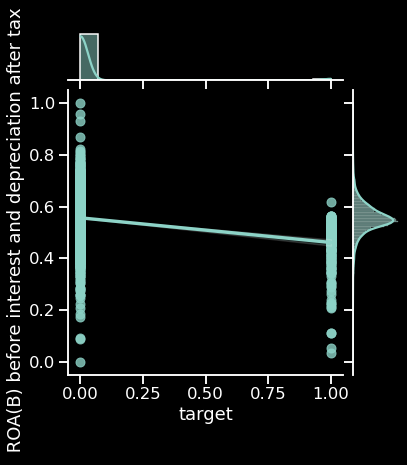

Correlacion entre Target y  ROA(C) before interest and depreciation before interest -0.2608065575202611


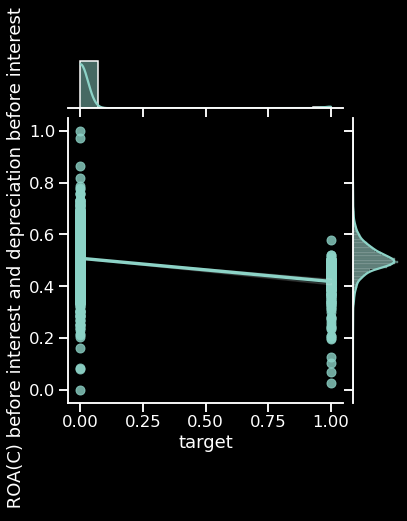

Correlacion entre Target y  Net worth/Assets -0.2501609620666194


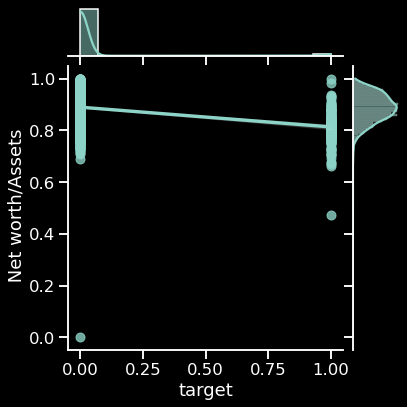

Correlacion entre Target y  Persistent EPS in the Last Four Seasons -0.21955968119078761


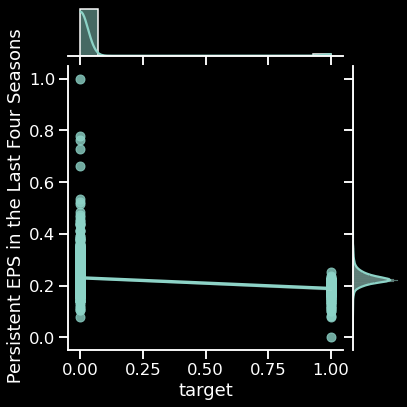

In [28]:
# Recorremos el pairplot para cada una de las variables con mayor correlación positiva y negativa con la variable target en detalle
plt.figure(dpi = 100, figsize = (5,4))
print('Joint plot de Target con otras variables ==>')
for i in df_summary.columns:
    if i != 'target':
        print(f'Correlacion entre Target y {i}',df_summary.corr().loc['target'][i])
        sns.jointplot(x='target',y=i,data=df_summary,kind = 'reg')
        plt.show()

Como se puede observar, existe una mayor posibilidad de que la empresa se encuentre en estado de cesación de pagos en los casos en donde su ratio de deuda es alto, sus pasivos corrientes son mayores a sus activos totales (y sus activos corrientes), tiene mayores pasivos totales (y pasivos correientes) que equity, y cuando su dependecia a los préstamos es alta.

Por otro lado, es menos problable que una empresa caiga en la quiebra cuando sus ingresos netos son mayores a sus activos, su rentabilidad economica (return on assets) es mayor a sus activos y es alto, su valor neto es mayor que sus activos y tiene un beneficio por acción alto para los ultimos años de forma persistente.

In [29]:
# Realizamos un profiling del dataset (también se acompaña el HTML por separado para una mejor visualización)
from pandas_profiling import ProfileReport
profile = ProfileReport(df_summary, title="Pandas Profiling Report", minimal=False, orange_mode=True)
profile

Render HTML: 100%|██████████| 1/1 [00:07<00:00,  7.00s/it]


In [30]:
# Divididmos el dataset para diferenciar la variable target
x = df.drop('target', axis=1)
y = df['target']

In [31]:
# Separameos los datos en training y testing en un 70% y 30%
from sklearn.model_selection import train_test_split
x_train, x_test, y_train, y_test = train_test_split(x, y, test_size = 0.30, random_state = 42)

In [32]:
from sklearn.preprocessing import StandardScaler
scaler = StandardScaler()
scaler.fit(x_train)
x_train = pd.DataFrame(scaler.transform(x_train), index=x_train.index, columns=x_train.columns)
x_test = pd.DataFrame(scaler.transform(x_test), index=x_test.index, columns=x_test.columns)

## Modelos

### Arbol de Decision

In [33]:
# Entrenamos un modelo de arbol de desicion
from sklearn.tree import DecisionTreeClassifier
dt = DecisionTreeClassifier(criterion='entropy', max_depth=2, random_state=42)
dt.fit(x_train,y_train)

DecisionTreeClassifier(criterion='entropy', max_depth=2, random_state=42)

In [34]:
# Predicciones en train y test
dt_y_train_pred = dt.predict(x_train)
dt_y_test_pred = dt.predict(x_test)

In [137]:
# Chequeamos el f1 del modelo
dt_train_f1 = f1_score(y_train, dt_y_train_pred, average='weighted')

dt_test_f1_score = f1_score(y_test, dt_y_test_pred, average='weighted')

print('Train F-1: ', dt_train_f1)
print('Test F-1: ', dt_test_f1)

Train Accuracy:  0.9555985956379653
Test Accuracy:  0.943185653731003


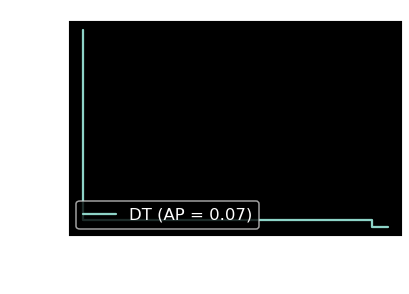

In [130]:
# Mostramos la curva precision-recall
display = PrecisionRecallDisplay.from_estimator(dt, x_test, y_test, name='DT')


              precision    recall  f1-score   support

           0       0.96      1.00      0.98      1968
           1       0.00      0.00      0.00        78

    accuracy                           0.96      2046
   macro avg       0.48      0.50      0.49      2046
weighted avg       0.93      0.96      0.94      2046

[[1968    0]
 [  78    0]]


/home/jvegasainz/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/home/jvegasainz/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/home/jvegasainz/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/home/jvegasainz/an

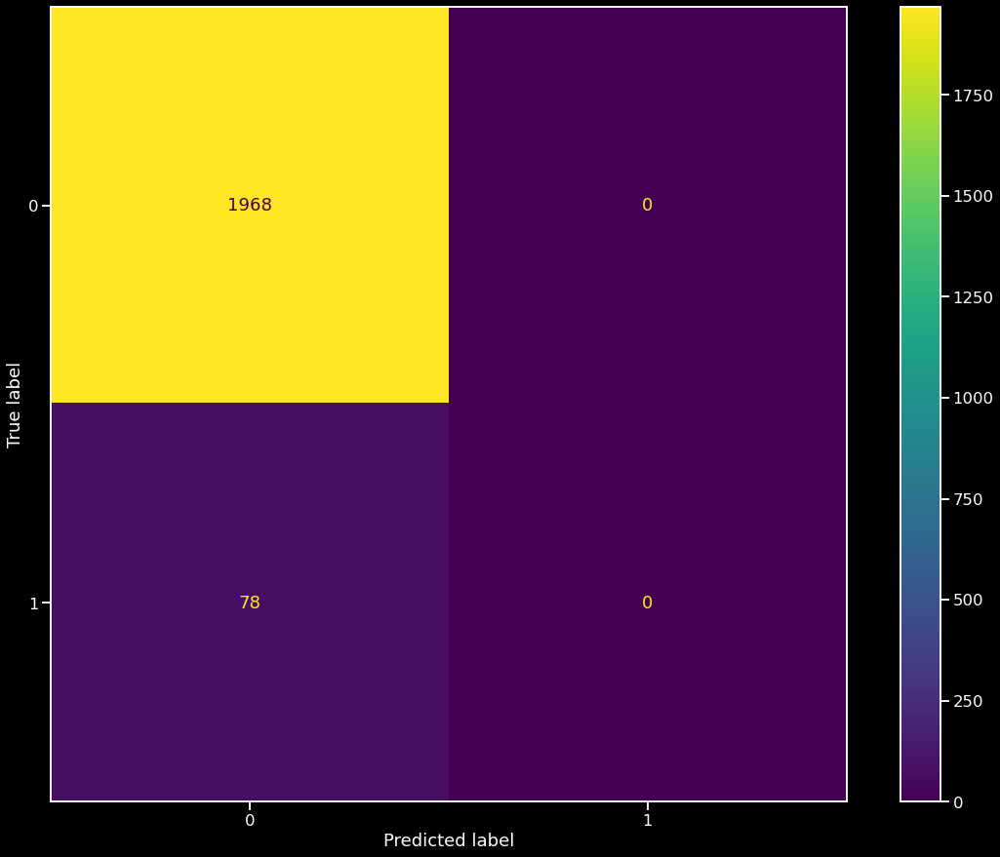

In [36]:
print(classification_report(y_test, dt_y_test_pred))
print(confusion_matrix(y_test, dt_y_test_pred))
plot_confusion_matrix(dt, x_test, y_test)

### Random Forest

In [37]:
# Entrenamos un modelo de random forest
from sklearn.ensemble import RandomForestClassifier
rf = RandomForestClassifier(n_estimators=50, criterion='entropy', random_state = 42)
rf.fit(x_train,y_train)

RandomForestClassifier(criterion='entropy', n_estimators=50, random_state=42)

In [38]:
# Predicciones en train y test
rf_y_train_pred = rf.predict(x_train)
rf_y_test_pred = rf.predict(x_test)

In [138]:
# Chequeamos el f1 del modelo
rf_train_f1 = f1_score(y_train, rf_y_train_pred, average='weighted')

rf_test_f1 = f1_score(y_test, rf_y_test_pred, average='weighted')

print('Train F-1: ', rf_train_f1)
print('Test F-1: ', rf_test_f1)

Train Accuracy:  0.9993682110756321
Test Accuracy:  0.9521963358496703


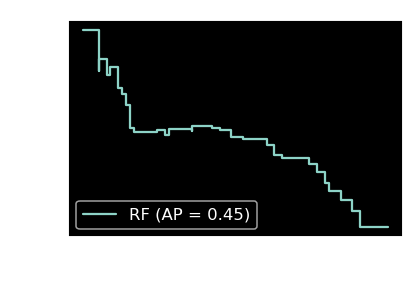

In [131]:
# Mostramos la curva precision-recall
display = PrecisionRecallDisplay.from_estimator(rf, x_test, y_test, name='RF')

              precision    recall  f1-score   support

           0       0.97      1.00      0.98      1968
           1       0.75      0.12      0.20        78

    accuracy                           0.96      2046
   macro avg       0.86      0.56      0.59      2046
weighted avg       0.96      0.96      0.95      2046

[[1965    3]
 [  69    9]]


/home/jvegasainz/anaconda3/lib/python3.8/site-packages/sklearn/utils/deprecation.py:87: FutureWarning: Function plot_confusion_matrix is deprecated; Function `plot_confusion_matrix` is deprecated in 1.0 and will be removed in 1.2. Use one of the class methods: ConfusionMatrixDisplay.from_predictions or ConfusionMatrixDisplay.from_estimator.
  warnings.warn(msg, category=FutureWarning)


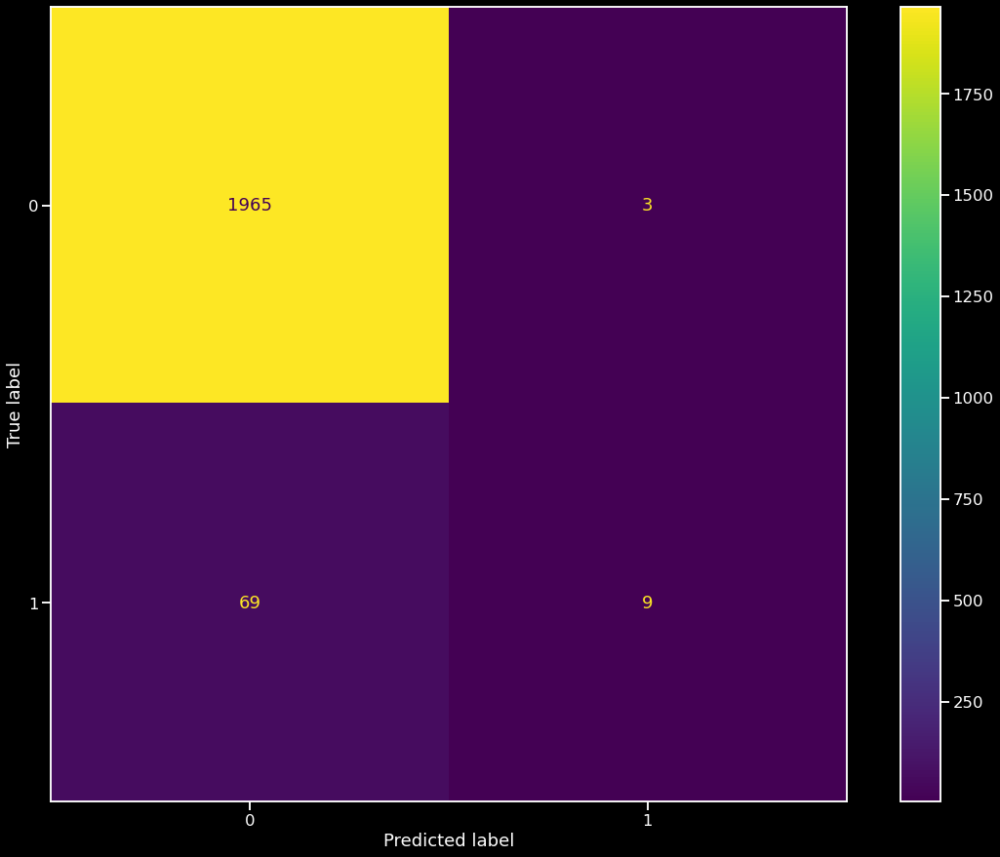

In [40]:
print(classification_report(y_test, rf_y_test_pred))
print(confusion_matrix(y_test, rf_y_test_pred))
plot_confusion_matrix(rf, x_test, y_test)

### Logistic Regresion

In [41]:
# Entrenamos un modelo de regresion logistica
from sklearn.linear_model import LogisticRegression
lr = LogisticRegression(max_iter = 10)
lr.fit(x_train,y_train)

/home/jvegasainz/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:814: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(


LogisticRegression(max_iter=10)

In [42]:
# Predicciones en train y test
lr_y_train_pred = lr.predict(x_train)
lr_y_test_pred = lr.predict(x_test)

In [43]:
# Chequeamos el f1 del modelo
lr_train_f1 = f1_score(y_train, lr_y_train_pred, average='weighted')

lr_test_f1_score = f1_score(y_test, lr_y_test_pred, average='weighted')

print('Train F-1: ', lr_train_f1)
print('Test F-1: ', lr_test_f1)

Train Accuracy:  0.972972972972973
Test Accuracy:  0.9633431085043989


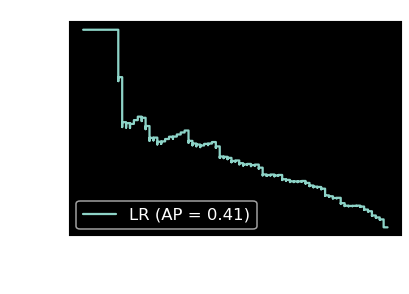

In [132]:
# Mostramos la curva precision-recall
display = PrecisionRecallDisplay.from_estimator(lr, x_test, y_test, name='LR')

              precision    recall  f1-score   support

           0       0.97      0.99      0.98      1968
           1       0.56      0.19      0.29        78

    accuracy                           0.96      2046
   macro avg       0.76      0.59      0.63      2046
weighted avg       0.95      0.96      0.95      2046

[[1956   12]
 [  63   15]]


/home/jvegasainz/anaconda3/lib/python3.8/site-packages/sklearn/utils/deprecation.py:87: FutureWarning: Function plot_confusion_matrix is deprecated; Function `plot_confusion_matrix` is deprecated in 1.0 and will be removed in 1.2. Use one of the class methods: ConfusionMatrixDisplay.from_predictions or ConfusionMatrixDisplay.from_estimator.
  warnings.warn(msg, category=FutureWarning)


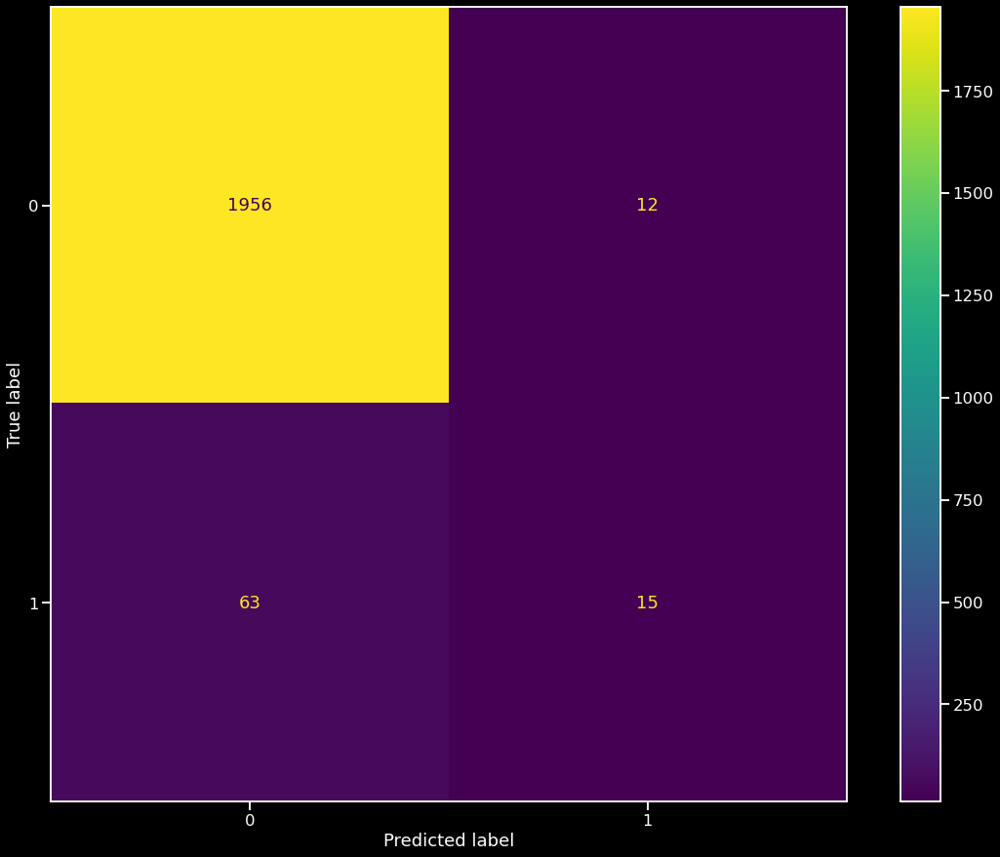

In [44]:
print(classification_report(y_test, lr_y_test_pred))
print(confusion_matrix(y_test, lr_y_test_pred))
plot_confusion_matrix(lr, x_test, y_test)

### K Nearest Neighbors

In [45]:
# Entrenamos un modelo de k nearest neighbors
from sklearn.neighbors import KNeighborsClassifier
knn = KNeighborsClassifier()
knn.fit(x_train,y_train)

KNeighborsClassifier()

In [46]:
# Predicciones en train y test
knn_y_train_pred = knn.predict(x_train)
knn_y_test_pred = knn.predict(x_test)

In [140]:
# Chequeamos el f1 del modelo
knn_train_f1 = f1_score(y_train, knn_y_train_pred, average='weighted')

knn_test_f1 = f1_score(y_test, knn_y_test_pred, average='weighted')

print('Train F-1: ', knn_train_f1)
print('Test F-1: ', knn_test_f1)

Train F-1:  0.9687656843059642
Test F-1:  0.9505481121777383


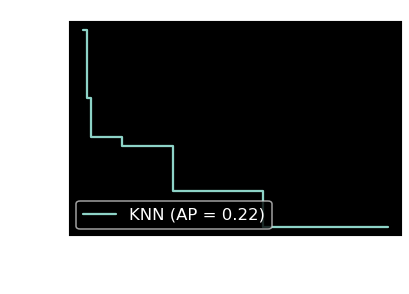

In [141]:
# Mostramos la curva precision-recall
display = PrecisionRecallDisplay.from_estimator(knn, x_test, y_test, name='KNN')

              precision    recall  f1-score   support

           0       0.97      0.99      0.98      1968
           1       0.48      0.13      0.20        78

    accuracy                           0.96      2046
   macro avg       0.72      0.56      0.59      2046
weighted avg       0.95      0.96      0.95      2046

[[1957   11]
 [  68   10]]


/home/jvegasainz/anaconda3/lib/python3.8/site-packages/sklearn/utils/deprecation.py:87: FutureWarning: Function plot_confusion_matrix is deprecated; Function `plot_confusion_matrix` is deprecated in 1.0 and will be removed in 1.2. Use one of the class methods: ConfusionMatrixDisplay.from_predictions or ConfusionMatrixDisplay.from_estimator.
  warnings.warn(msg, category=FutureWarning)


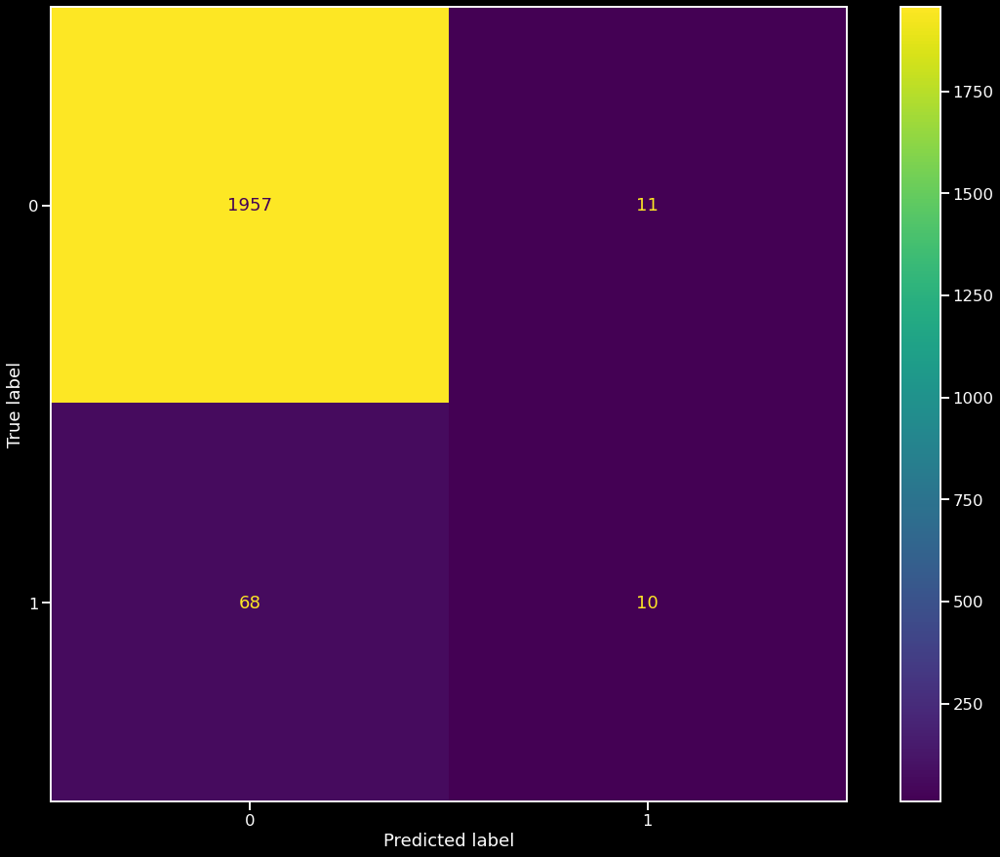

In [49]:
print(classification_report(y_test, knn_y_test_pred))
print(confusion_matrix(y_test, knn_y_test_pred))
plot_confusion_matrix(knn, x_test, y_test)

### SVM

In [50]:
# Entrenamos un modelo de SVM
from sklearn.svm import SVC
svc = SVC(kernel = 'rbf')
svc.fit(x_train,y_train)

SVC()

In [51]:
# Predicciones en train y test
svc_y_train_pred = svc.predict(x_train)
svc_y_test_pred = svc.predict(x_test)

In [142]:
# Chequeamos el f1 del modelo
svc_train_f1 = f1_score(y_train, svc_y_train_pred, average='weighted')

svc_test_f1 = f1_score(y_test, svc_y_test_pred, average='weighted')

print('Train F-1: ', svc_train_f1)
print('Test F-1: ', svc_test_f1)

Train F-1:  0.9670531612595705
Test F-1:  0.9429413058585989


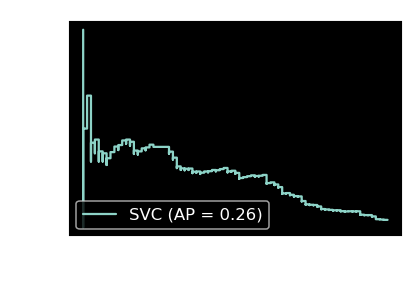

In [143]:
# Mostramos la curva precision-recall
display = PrecisionRecallDisplay.from_estimator(svc, x_test, y_test, name='SVC')

              precision    recall  f1-score   support

           0       0.96      1.00      0.98      1968
           1       0.00      0.00      0.00        78

    accuracy                           0.96      2046
   macro avg       0.48      0.50      0.49      2046
weighted avg       0.93      0.96      0.94      2046

[[1967    1]
 [  78    0]]


/home/jvegasainz/anaconda3/lib/python3.8/site-packages/sklearn/utils/deprecation.py:87: FutureWarning: Function plot_confusion_matrix is deprecated; Function `plot_confusion_matrix` is deprecated in 1.0 and will be removed in 1.2. Use one of the class methods: ConfusionMatrixDisplay.from_predictions or ConfusionMatrixDisplay.from_estimator.
  warnings.warn(msg, category=FutureWarning)


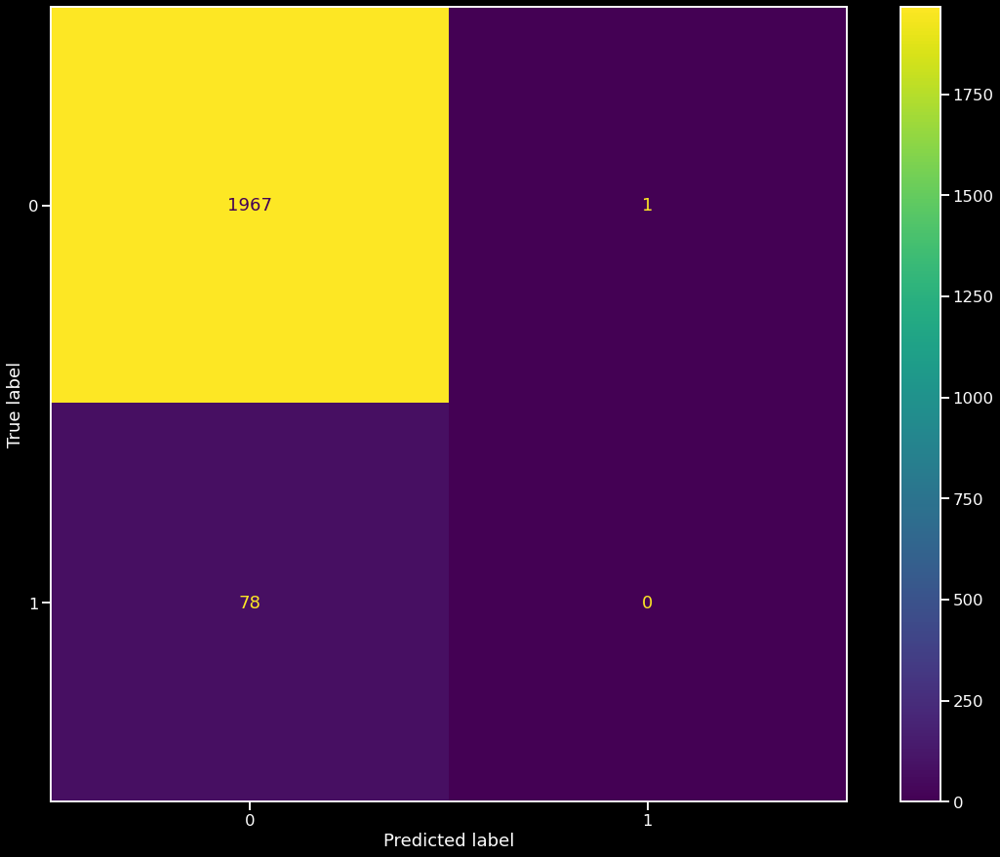

In [53]:
print(classification_report(y_test, svc_y_test_pred))
print(confusion_matrix(y_test, svc_y_test_pred))
plot_confusion_matrix(svc, x_test, y_test)

### Naive Bayes

In [54]:
# Entrenamos un modelo de Naive Bayes
from sklearn.naive_bayes import GaussianNB
nb = GaussianNB()
nb.fit(x_train,y_train)

GaussianNB()

In [55]:
# Predicciones en train y test
nb_y_train_pred = nb.predict(x_train)
nb_y_test_pred = nb.predict(x_test)

In [144]:
# Chequeamos el f1 del modelo
nb_train_f1 = f1_score(y_train, nb_y_train_pred, average='weighted')

nb_test_f1 = f1_score(y_test, nb_y_test_pred, average='weighted')

print('Train F-1: ', nb_train_f1)
print('Test F-1: ', nb_test_f1)

Train F-1:  0.3078124174266502
Test F-1:  0.2873325610131842


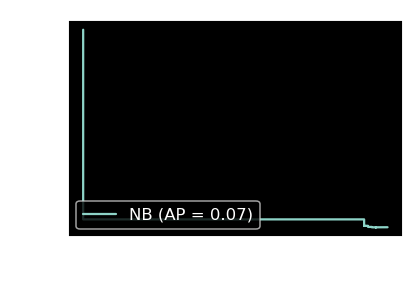

In [145]:
# Mostramos la curva precision-recall
display = PrecisionRecallDisplay.from_estimator(nb, x_test, y_test, name='NB')

              precision    recall  f1-score   support

           0       0.99      0.17      0.30      1968
           1       0.04      0.94      0.08        78

    accuracy                           0.20      2046
   macro avg       0.51      0.55      0.19      2046
weighted avg       0.95      0.20      0.29      2046

[[ 342 1626]
 [   5   73]]


/home/jvegasainz/anaconda3/lib/python3.8/site-packages/sklearn/utils/deprecation.py:87: FutureWarning: Function plot_confusion_matrix is deprecated; Function `plot_confusion_matrix` is deprecated in 1.0 and will be removed in 1.2. Use one of the class methods: ConfusionMatrixDisplay.from_predictions or ConfusionMatrixDisplay.from_estimator.
  warnings.warn(msg, category=FutureWarning)


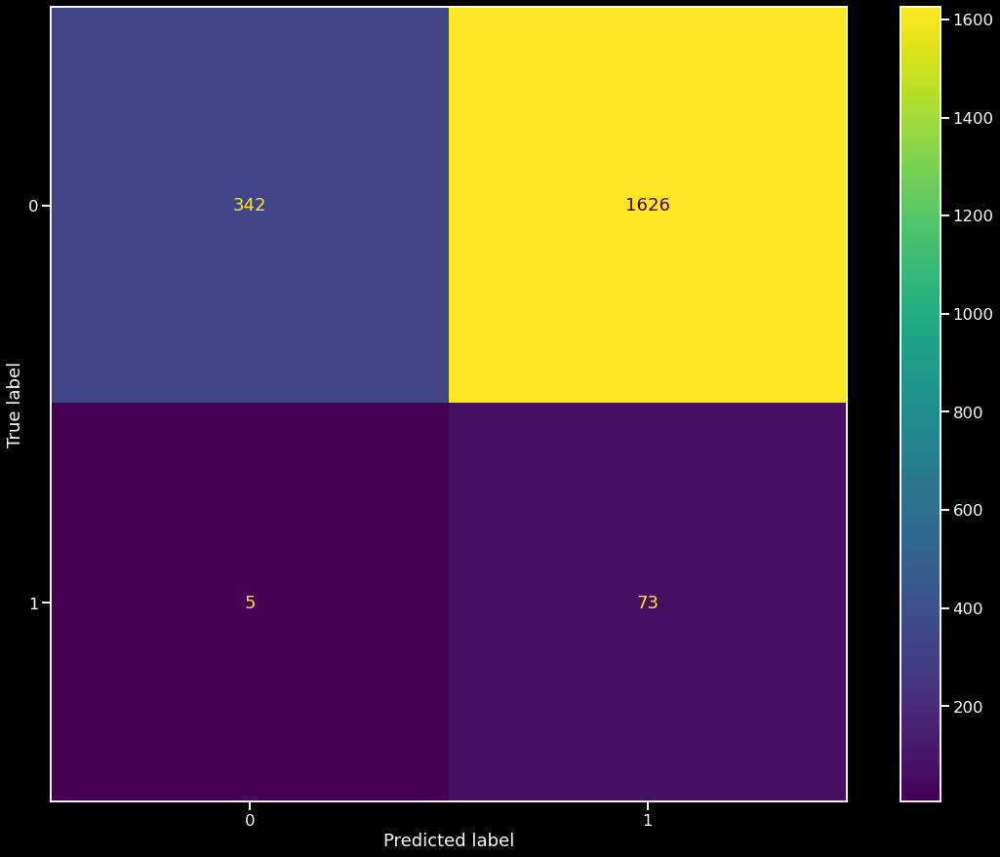

In [57]:
print(classification_report(y_test, nb_y_test_pred))
print(confusion_matrix(y_test, nb_y_test_pred))
plot_confusion_matrix(nb, x_test, y_test)

### Analisis de F-1 de los Modelos

Text(0.5, 1.0, 'Accuracy de los Modelos en Train')

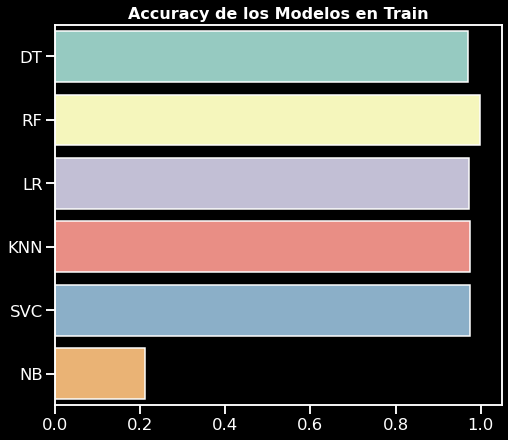

In [58]:
plt.figure(figsize= (8,7))
acc = [dt_test_f1, rf_test_f1, lr_test_f1, knn_test_f1, svc_test_f1, nb_test_f1]
name = ['DT','RF','LR','KNN','SVC', 'NB']
sns.barplot(x = acc, y = name)
plt.title("Accuracy de los Modelos en Test", fontsize=16, fontweight="bold")

## Haciendonos Cargo del Desbalance

In [59]:
from imblearn.over_sampling import SMOTE

In [61]:
smote = SMOTE(sampling_strategy='minority')
x_smote, y_smote = smote.fit_resample(x, y)

In [64]:
from collections import Counter
print('Resampled dataset shape %s' % Counter(y_smote))

Resampled dataset shape Counter({1: 6599, 0: 6599})


/home/jvegasainz/anaconda3/lib/python3.8/site-packages/seaborn/_decorators.py:36: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


<AxesSubplot:xlabel='target', ylabel='count'>

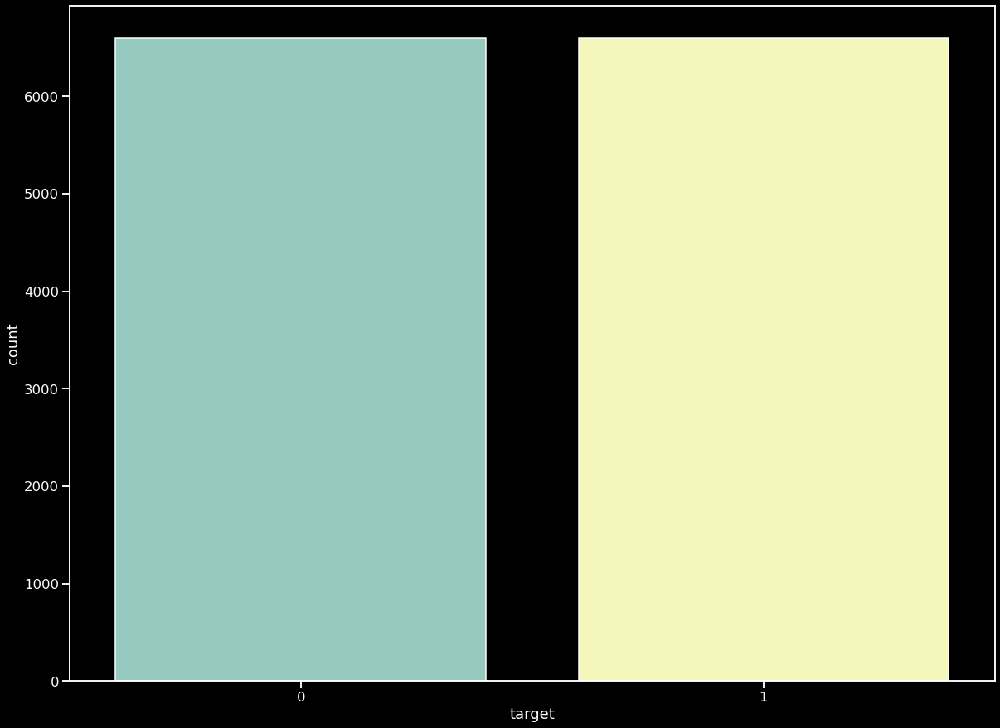

In [75]:
y_res = pd.DataFrame(data=y_smote)
sns.countplot('target', data=y_res)

In [77]:
# Separameos los datos en training y testing en un 70% y 30%
x_train_smote, x_test_smote, y_train_smote, y_test_smote = train_test_split(x_smote, y_smote, test_size = 0.30, random_state = 42)

In [78]:
scaler = StandardScaler()
scaler.fit(x_train_smote)
x_train_smote = pd.DataFrame(scaler.transform(x_train_smote), index=x_train_smote.index, columns=x_train_smote.columns)
x_test_smote = pd.DataFrame(scaler.transform(x_test_smote), index=x_test_smote.index, columns=x_test_smote.columns)

## Modelos

### Arbol de Decision

In [82]:
# Entrenamos un modelo de arbol de desicion
dt_smote = DecisionTreeClassifier(criterion='entropy', max_depth=2, random_state=42)
dt_smote.fit(x_train_smote,y_train_smote)

DecisionTreeClassifier(criterion='entropy', max_depth=2, random_state=42)

In [83]:
# Predicciones en train y test
dt_y_train_smote_pred = dt_smote.predict(x_train_smote)
dt_y_test_smote_pred = dt_smote.predict(x_test_smote)

In [84]:
dt_train_smote_accuracy = accuracy_score(y_train_smote, dt_y_train_smote_pred)

dt_test_smote_accuracy = accuracy_score(y_test_smote, dt_y_test_smote_pred)

print('Train Accuracy: ', dt_train_smote_accuracy)
print('Test Accuracy: ', dt_test_smote_accuracy)

Train Accuracy:  0.850617016670275
Test Accuracy:  0.8416666666666667


              precision    recall  f1-score   support

           0       0.89      0.78      0.83      2005
           1       0.80      0.90      0.85      1955

    accuracy                           0.84      3960
   macro avg       0.85      0.84      0.84      3960
weighted avg       0.85      0.84      0.84      3960

[[1570  435]
 [ 192 1763]]


/home/jvegasainz/anaconda3/lib/python3.8/site-packages/sklearn/utils/deprecation.py:87: FutureWarning: Function plot_confusion_matrix is deprecated; Function `plot_confusion_matrix` is deprecated in 1.0 and will be removed in 1.2. Use one of the class methods: ConfusionMatrixDisplay.from_predictions or ConfusionMatrixDisplay.from_estimator.
  warnings.warn(msg, category=FutureWarning)


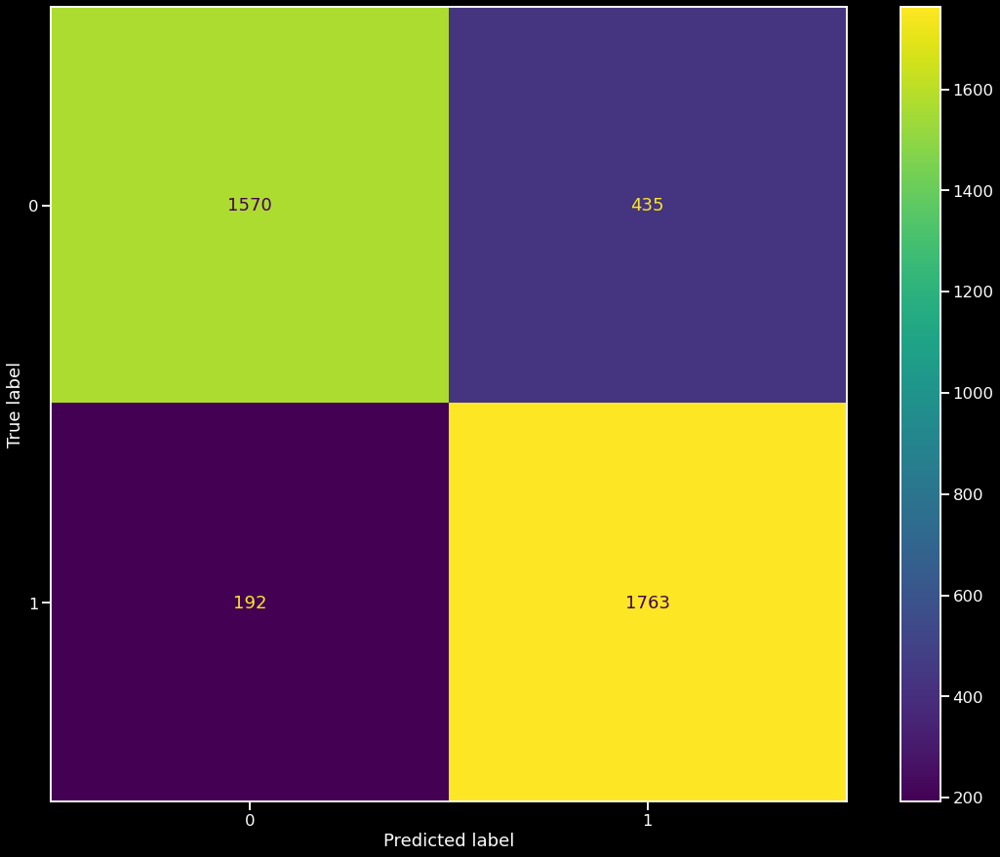

In [85]:
print(classification_report(y_test_smote, dt_y_test_smote_pred))
print(confusion_matrix(y_test_smote, dt_y_test_smote_pred))
plot_confusion_matrix(dt, x_test_smote, y_test_smote)

### Random Forest

In [91]:
# Entrenamos un modelo de random forest
rf_smote = RandomForestClassifier(n_estimators=50, criterion='entropy', random_state = 42)
rf_smote.fit(x_train_smote,y_train_smote)

RandomForestClassifier(criterion='entropy', n_estimators=50, random_state=42)

In [92]:
# Predicciones en train y test
rf_y_train_smote_pred = rf_smote.predict(x_train_smote)
rf_y_test_smote_pred = rf_smote.predict(x_test_smote)

In [93]:
# Chequeamos el accuracy del modelo
rf_train_smote_accuracy = accuracy_score(y_train_smote, rf_y_train_smote_pred)

rf_test_smote_accuracy = accuracy_score(y_test_smote, rf_y_test_smote_pred)

print('Train Accuracy: ', rf_train_smote_accuracy)
print('Test Accuracy: ', rf_test_smote_accuracy)

Train Accuracy:  1.0
Test Accuracy:  0.977020202020202


              precision    recall  f1-score   support

           0       1.00      0.96      0.98      2005
           1       0.96      1.00      0.98      1955

    accuracy                           0.98      3960
   macro avg       0.98      0.98      0.98      3960
weighted avg       0.98      0.98      0.98      3960

[[1922   83]
 [   8 1947]]


/home/jvegasainz/anaconda3/lib/python3.8/site-packages/sklearn/utils/deprecation.py:87: FutureWarning: Function plot_confusion_matrix is deprecated; Function `plot_confusion_matrix` is deprecated in 1.0 and will be removed in 1.2. Use one of the class methods: ConfusionMatrixDisplay.from_predictions or ConfusionMatrixDisplay.from_estimator.
  warnings.warn(msg, category=FutureWarning)


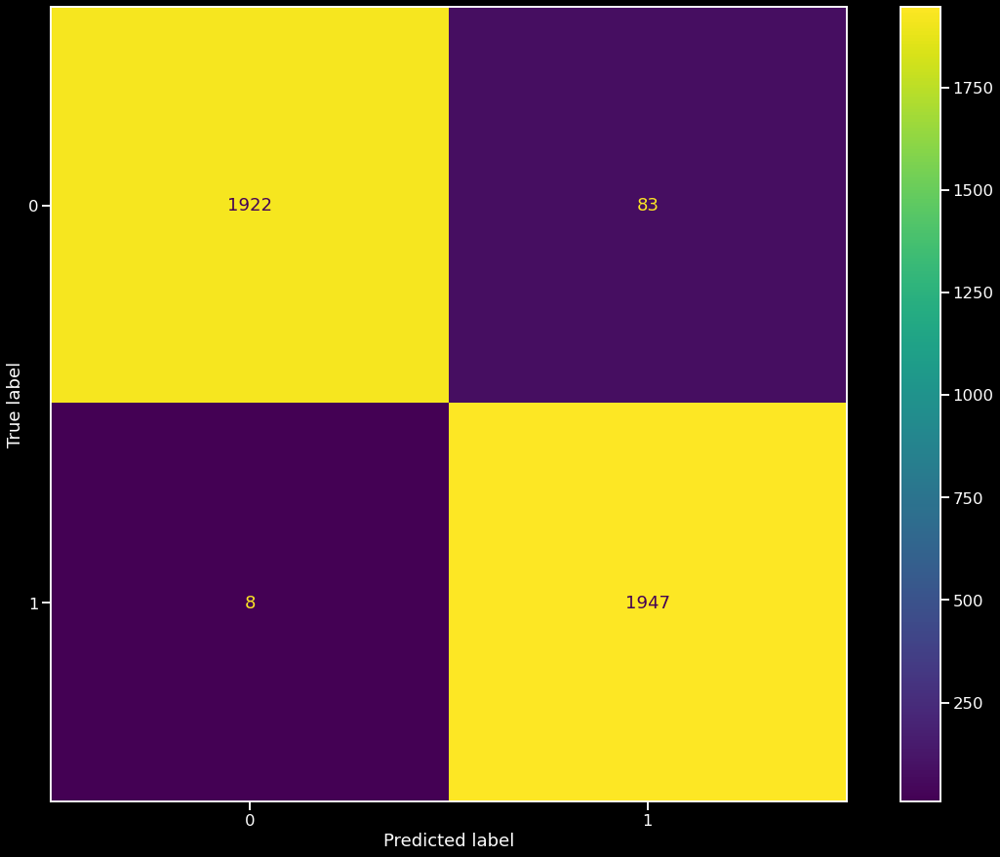

In [94]:
print(classification_report(y_test_smote, rf_y_test_smote_pred))
print(confusion_matrix(y_test_smote, rf_y_test_smote_pred))
plot_confusion_matrix(rf_smote, x_test_smote, y_test_smote)

### Logistic Regresion

In [90]:
# Entrenamos un modelo de regresion logistica
lr_smote = LogisticRegression(max_iter = 10)
lr_smote.fit(x_train_smote,y_train_smote)

/home/jvegasainz/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:814: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(


LogisticRegression(max_iter=10)

In [96]:
# Predicciones en train y test
lr_y_train_smote_pred = lr_smote.predict(x_train_smote)
lr_y_test_smote_pred = lr_smote.predict(x_test_smote)

In [97]:
# Chequeamos el accuracy del modelo
lr_train_smote_accuracy = accuracy_score(y_train_smote, lr_y_train_smote_pred)

lr_test_smote_accuracy = accuracy_score(y_test_smote, lr_y_test_smote_pred)

print('Train Accuracy: ', lr_train_smote_accuracy)
print('Test Accuracy: ', lr_test_smote_accuracy)

Train Accuracy:  0.9059320199177311
Test Accuracy:  0.9017676767676768


              precision    recall  f1-score   support

           0       0.92      0.89      0.90      2005
           1       0.89      0.92      0.90      1955

    accuracy                           0.90      3960
   macro avg       0.90      0.90      0.90      3960
weighted avg       0.90      0.90      0.90      3960

[[1777  228]
 [ 161 1794]]


/home/jvegasainz/anaconda3/lib/python3.8/site-packages/sklearn/utils/deprecation.py:87: FutureWarning: Function plot_confusion_matrix is deprecated; Function `plot_confusion_matrix` is deprecated in 1.0 and will be removed in 1.2. Use one of the class methods: ConfusionMatrixDisplay.from_predictions or ConfusionMatrixDisplay.from_estimator.
  warnings.warn(msg, category=FutureWarning)


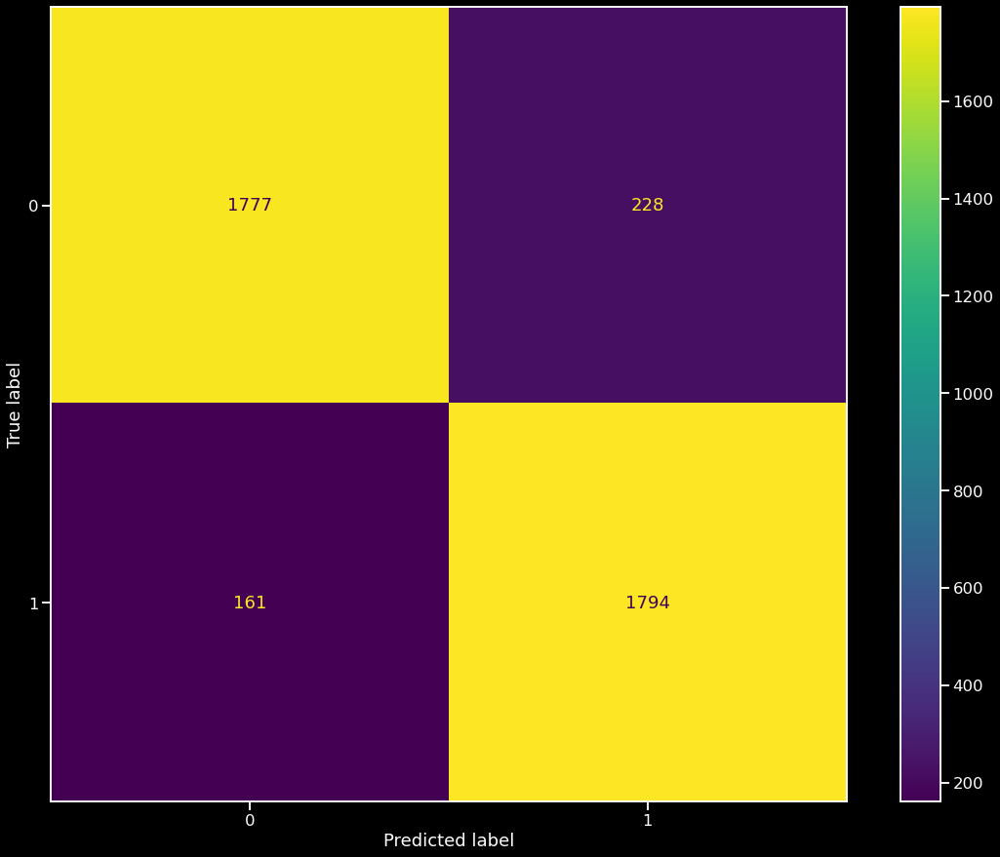

In [98]:
print(classification_report(y_test_smote, lr_y_test_smote_pred))
print(confusion_matrix(y_test_smote, lr_y_test_smote_pred))
plot_confusion_matrix(lr_smote, x_test_smote, y_test_smote)

### K Nearest Neighbors

In [102]:
# Entrenamos un modelo de k nearest neighbors
knn_smote = KNeighborsClassifier()
knn_smote.fit(x_train_smote,y_train_smote)

KNeighborsClassifier()

In [104]:
# Predicciones en train y test
knn_y_train_smote_pred = knn_smote.predict(x_train_smote)
knn_y_test_smote_pred = knn_smote.predict(x_test_smote)

In [105]:
# Chequeamos el accuracy del modelo
knn_train_smote_accuracy = accuracy_score(y_train_smote, knn_y_train_smote_pred)

knn_test_smote_accuracy = accuracy_score(y_test_smote, knn_y_test_smote_pred)

print('Train Accuracy: ', knn_train_smote_accuracy)
print('Test Accuracy: ', knn_test_smote_accuracy)

Train Accuracy:  0.9550768564624378
Test Accuracy:  0.9436868686868687


              precision    recall  f1-score   support

           0       0.89      0.78      0.83      2005
           1       0.80      0.90      0.85      1955

    accuracy                           0.84      3960
   macro avg       0.85      0.84      0.84      3960
weighted avg       0.85      0.84      0.84      3960

[[1570  435]
 [ 192 1763]]


/home/jvegasainz/anaconda3/lib/python3.8/site-packages/sklearn/utils/deprecation.py:87: FutureWarning: Function plot_confusion_matrix is deprecated; Function `plot_confusion_matrix` is deprecated in 1.0 and will be removed in 1.2. Use one of the class methods: ConfusionMatrixDisplay.from_predictions or ConfusionMatrixDisplay.from_estimator.
  warnings.warn(msg, category=FutureWarning)


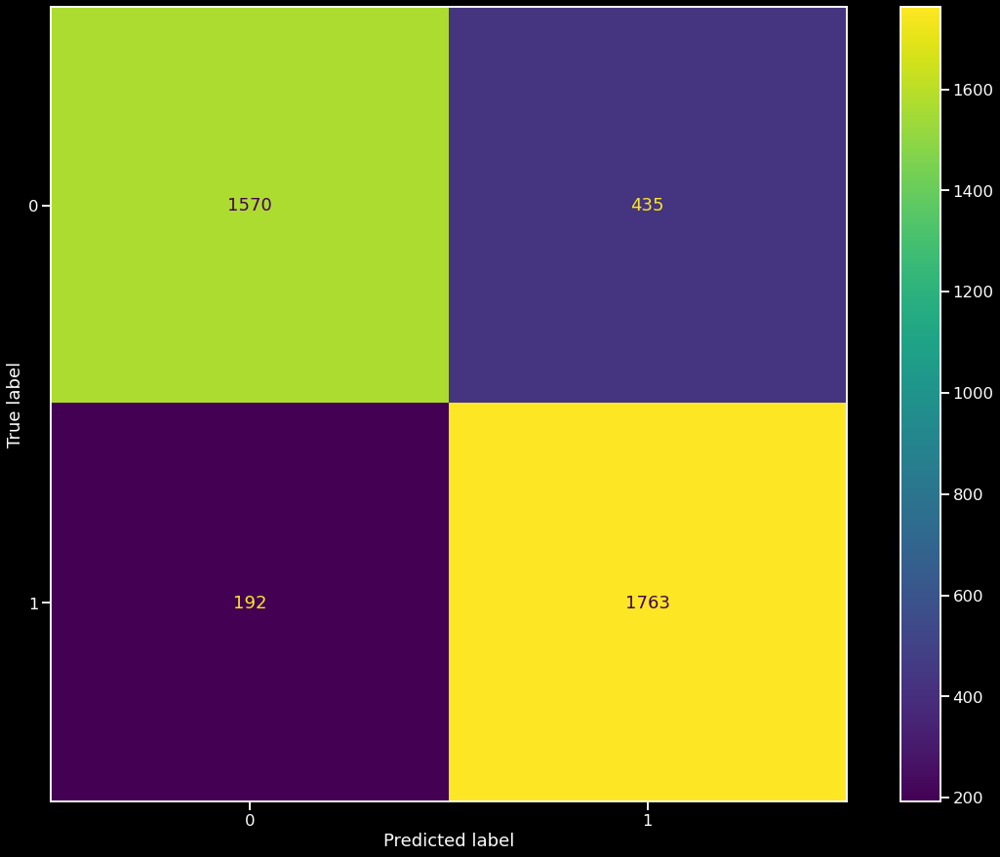

In [106]:
print(classification_report(y_test_smote, dt_y_test_smote_pred))
print(confusion_matrix(y_test_smote, dt_y_test_smote_pred))
plot_confusion_matrix(dt_smote, x_test_smote, y_test_smote)

### SVM

In [110]:
# Entrenamos un modelo de SVM
svc_smote = SVC(kernel = 'rbf')
svc_smote.fit(x_train_smote,y_train_smote)

SVC()

In [111]:
# Predicciones en train y test
svc_y_train_smote_pred = svc_smote.predict(x_train_smote)
svc_y_test_smote_pred = svc_smote.predict(x_test_smote)

In [113]:
# Chequeamos el accuracy del modelo
svc_train_smote_accuracy = accuracy_score(y_train_smote, svc_y_train_smote_pred)

svc_test_smote_accuracy = accuracy_score(y_test_smote, svc_y_test_smote_pred)

print('Train Accuracy: ', svc_train_smote_accuracy)
print('Test Accuracy: ', svc_test_smote_accuracy)

Train Accuracy:  0.9555098506170167
Test Accuracy:  0.9532828282828283


              precision    recall  f1-score   support

           0       0.98      0.92      0.95      2005
           1       0.93      0.98      0.95      1955

    accuracy                           0.95      3960
   macro avg       0.95      0.95      0.95      3960
weighted avg       0.96      0.95      0.95      3960

[[1852  153]
 [  32 1923]]


/home/jvegasainz/anaconda3/lib/python3.8/site-packages/sklearn/utils/deprecation.py:87: FutureWarning: Function plot_confusion_matrix is deprecated; Function `plot_confusion_matrix` is deprecated in 1.0 and will be removed in 1.2. Use one of the class methods: ConfusionMatrixDisplay.from_predictions or ConfusionMatrixDisplay.from_estimator.
  warnings.warn(msg, category=FutureWarning)


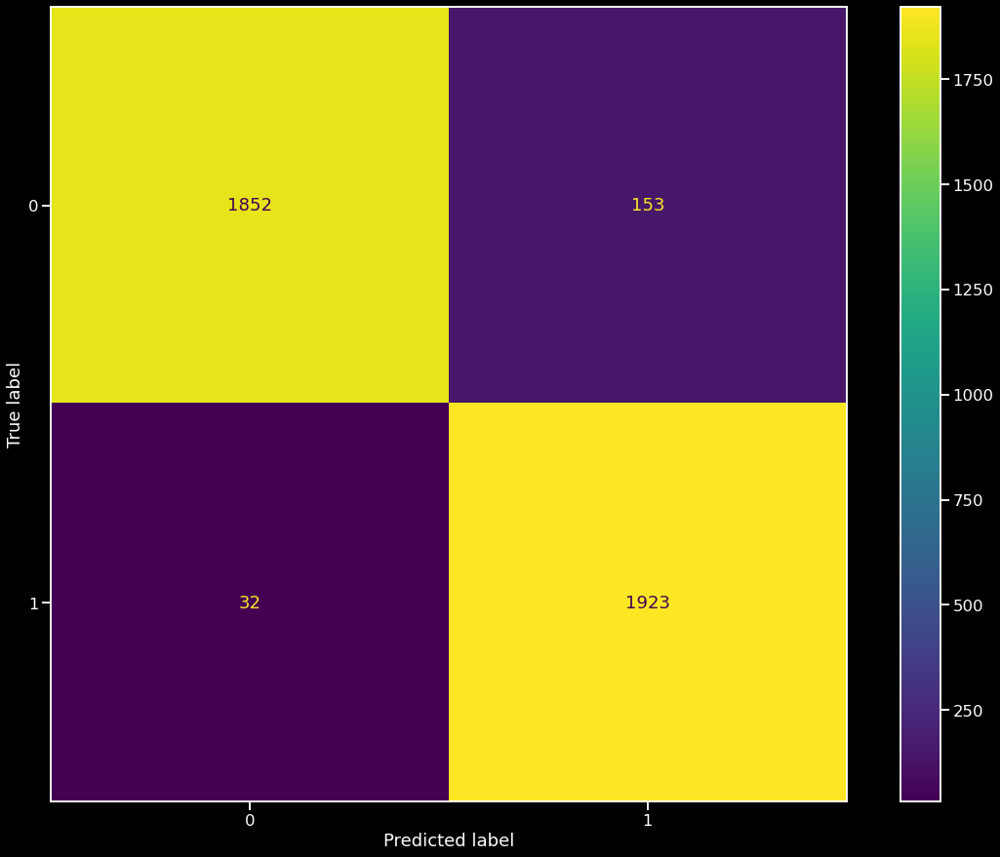

In [114]:
print(classification_report(y_test_smote, svc_y_test_smote_pred))
print(confusion_matrix(y_test_smote, svc_y_test_smote_pred))
plot_confusion_matrix(svc_smote, x_test_smote, y_test_smote)

### Naive Bayes

In [115]:
# Entrenamos un modelo de Naive Bayes
nb_smote = GaussianNB()
nb_smote.fit(x_train_smote,y_train_smote)

GaussianNB()

In [116]:
# Predicciones en train y test
nb_y_train_smote_pred = nb_smote.predict(x_train_smote)
nb_y_test_smote_pred = nb_smote.predict(x_test_smote)

In [117]:
# Chequeamos el accuracy del modelo
nb_train_smote_accuracy = accuracy_score(y_train_smote, nb_y_train_smote_pred)

nb_test_smote_accuracy = accuracy_score(y_test_smote, nb_y_test_smote_pred)

print('Train Accuracy: ', nb_train_smote_accuracy)
print('Test Accuracy: ', nb_test_smote_accuracy)

Train Accuracy:  0.7424767265641914
Test Accuracy:  0.7328282828282828


              precision    recall  f1-score   support

           0       0.92      0.52      0.66      2005
           1       0.66      0.96      0.78      1955

    accuracy                           0.73      3960
   macro avg       0.79      0.74      0.72      3960
weighted avg       0.79      0.73      0.72      3960

[[1033  972]
 [  86 1869]]


/home/jvegasainz/anaconda3/lib/python3.8/site-packages/sklearn/utils/deprecation.py:87: FutureWarning: Function plot_confusion_matrix is deprecated; Function `plot_confusion_matrix` is deprecated in 1.0 and will be removed in 1.2. Use one of the class methods: ConfusionMatrixDisplay.from_predictions or ConfusionMatrixDisplay.from_estimator.
  warnings.warn(msg, category=FutureWarning)


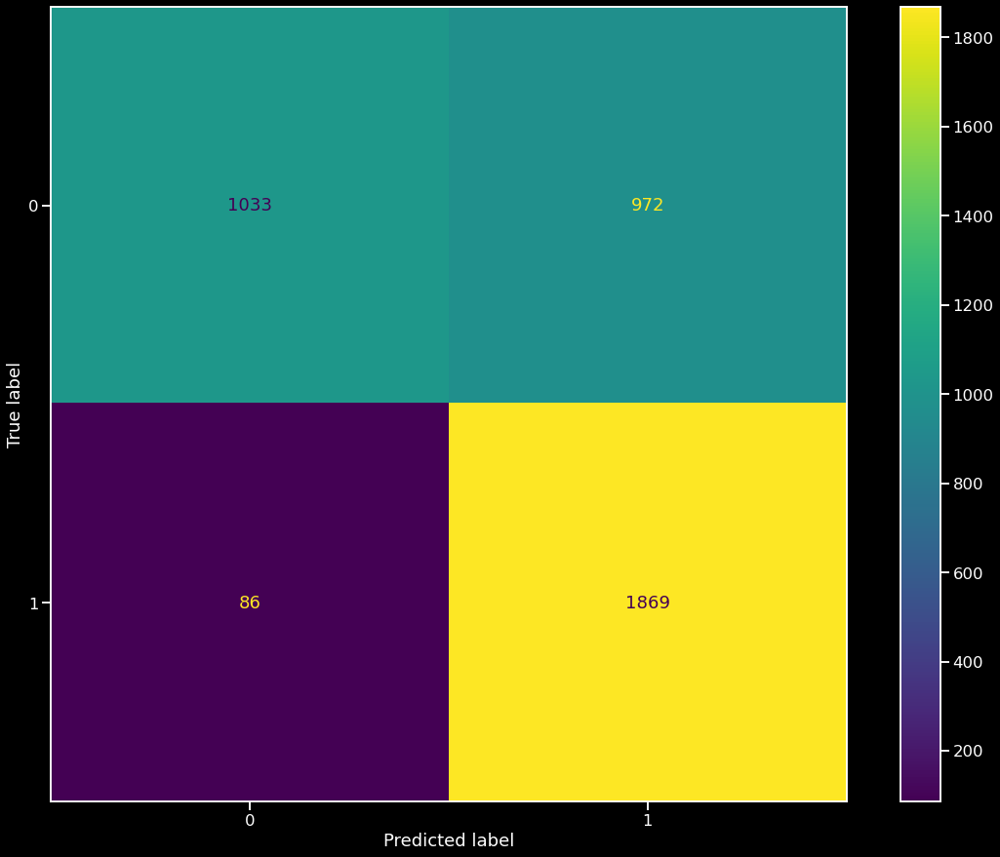

In [119]:
print(classification_report(y_test_smote, nb_y_test_smote_pred))
print(confusion_matrix(y_test_smote, nb_y_test_smote_pred))
plot_confusion_matrix(nb_smote, x_test_smote, y_test_smote)

## Analisis de Accuracy

Text(0.5, 1.0, 'Accuracy de los Modelos en Test')

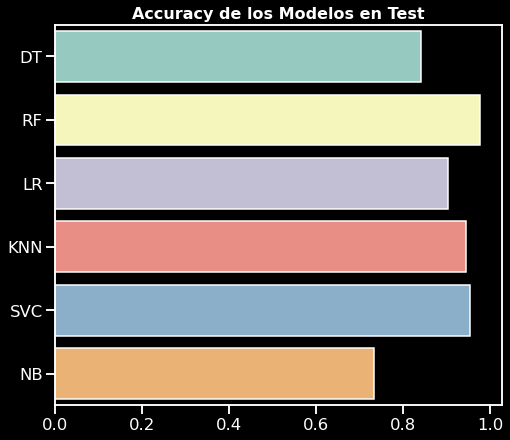

In [120]:
plt.figure(figsize= (8,7))
acc_smote = [dt_test_smote_accuracy, rf_test_smote_accuracy, lr_test_smote_accuracy, knn_test_smote_accuracy, svc_test_smote_accuracy, nb_test_smote_accuracy]
name = ['DT','RF','LR','KNN','SVC', 'NB']
sns.barplot(x = acc_smote, y = name)
plt.title("Accuracy de los Modelos en Test", fontsize=16, fontweight="bold")